In [ ]:
from google.colab import auth
import google.colab
auth.authenticate_user()
print('Authenticated')

Authenticated


In [ ]:
#Accessing Files on Drive
from google.colab import drive
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
%%capture
!pip install rtree
!pip install pygeos
!pip install geopandas
!pip install mapclassify

In [ ]:
import numpy as np
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
import rtree
import geopandas as gpd
import shapely
from shapely import wkt
import mapclassify
import math
import pygeos

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT 
  longitude, latitude, COUNT(*) AS count
FROM `urban-forest-269703.urbanforest.final`
  GROUP BY longitude, latitude

In [ ]:
%%bigquery --project urban-forest-269703 df_birds
SELECT DISTINCT
   decimalLatitude AS Latitude, decimalLongitude AS Longitude
FROM `urban-forest-269703.ebird.ebird-final`

In [ ]:
%%bigquery --project urban-forest-269703 df_grid
SELECT * FROM `urban-forest-269703.treebirdagg.10km-stats`

In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT latitude, longitude, COUNT(*) AS count 
  FROM `urban-forest-269703.urbanforest.final-with-grid` AS final
  GROUP BY latitude, longitude

In [ ]:
gdf_grid = gpd.GeoDataFrame(df_grid, geometry=gpd.GeoSeries.from_wkt(df_grid["geom"]), crs="EPSG:4326")
#gdf_trees = gpd.GeoDataFrame(df_trees, geometry=gpd.GeoSeries.from_xy(df_trees["longitude"], df_trees["latitude"]), crs="EPSG:4326")
#gdf_birds = gpd.GeoDataFrame(df_birds, geometry=gpd.GeoSeries.from_xy(df_birds["Longitude"], df_birds["Latitude"]), crs="EPSG:4326")

# Basic Plot Outline ✓

In [ ]:
df_grid.columns

Index(['ID', 'geom', 'BirdCounts', 'TreeCounts', 'LogBirdCounts',
       'LogTreeCounts', 'TreeSpeciesCounts', 'BirdSpeciesCounts',
       'CountNativeTrees', 'PercentNativeTrees', 'CountNativeTreeSpecies',
       'ShannonTree', 'ShannonBird', 'EvenTrees', 'EvenBirds', 'LoveTrees',
       'LoveBirds', 'Population', 'percent10', 'percent20',
       'avg_act_evaptrans', 'avg_pot_evaptrans', 'avg_precip', 'avg_temp_max',
       'avg_temp_min', 'avg_water_deficit', 'avg_beta_richness_bird',
       'avg_beta_richness_tree', 'avg_beta_turnover_bird',
       'avg_beta_turnover_tree', 'pct_deciduous', 'pct_evergreen',
       'pct_partly_deciduous', 'cnt_dehiscent', 'cnt_fleshy_fruit',
       'cnt_indehiscent', 'pct_dioecious', 'pct_monoecious',
       'pct_perfect_flowers', 'avg_avg_height', 'avg_avg_dbh',
       'avg_avg_canopy_size', 'nativeTree', 'nativeSpecies', 'pct_fragrance',
       'pct_dense', 'geometry'],
      dtype='object')

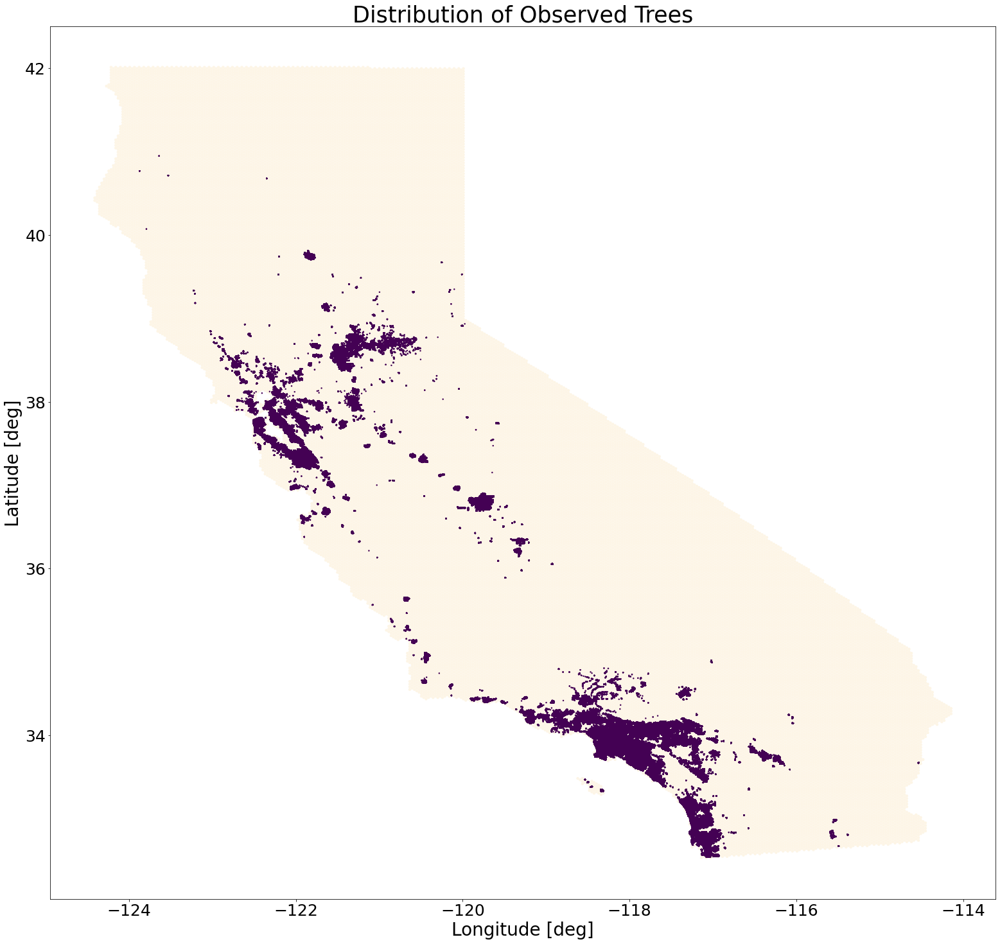

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
gdf_grid.plot(ax=ax, color='oldlace') 
ax2 = gdf_grid.plot(ax=ax, column=gdf_grid['n'], markersize=2, legend=True)

ax.set_xlabel('Longitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_ylabel('Latitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_title('Distribution of Observed Trees', fontdict={'fontsize': 35, 'fontweight': 'medium'})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
ax2.figure.axes[1].tick_params(labelsize=25)
fig.show()

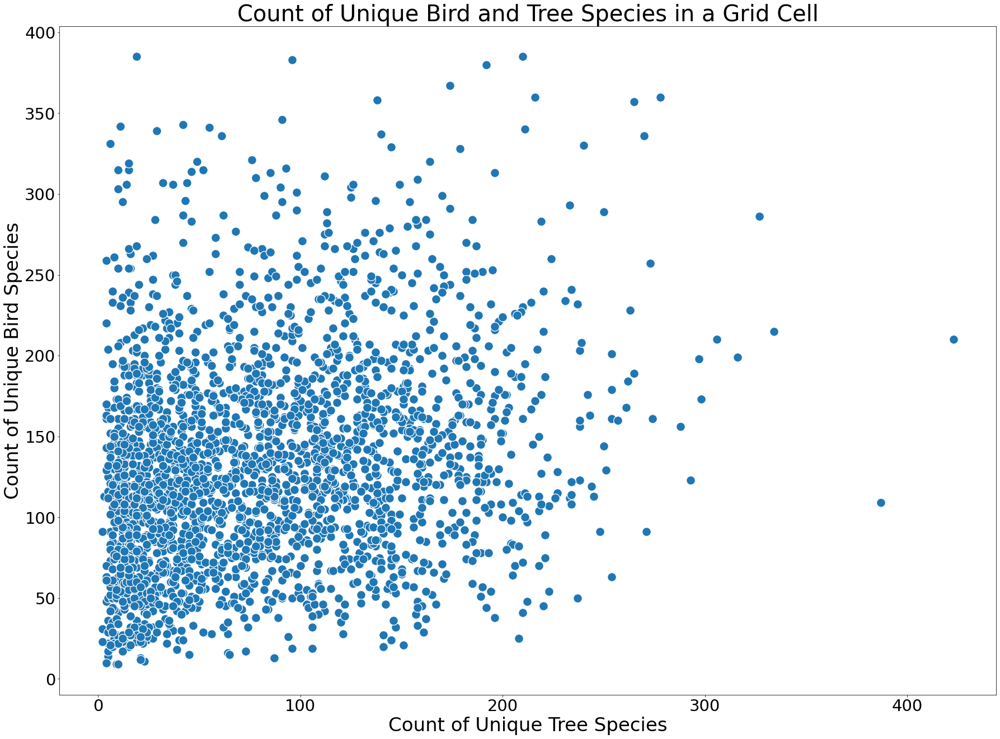

In [ ]:
fig,ax = plt.subplots(figsize=(30,22))
sns.scatterplot(ax=ax, data=df_report, x='TreeSpeciesCounts', y='BirdSpeciesCounts', s=250)
ax.set_xlabel('Count of Unique Tree Species', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_ylabel('Count of Unique Bird Species', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_title('Count of Unique Bird and Tree Species in a Grid Cell', fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.xticks(fontsize=29)
plt.yticks(fontsize=29)
fig.show()

# Final Report Stuff

## Bird ZipCodes

In [ ]:
cd drive/MyDrive/'Cal Fire Urban Forestry Bird Diversity Project'/'CA Grids'/'ZipCodes'

/content/drive/.shortcut-targets-by-id/19j9YdaLhu7ixHd8XS0vmx4u8aFAHNFJ4/Cal Fire Urban Forestry Tree Bird Biodiversity Project/CA Grids/ZipCodes


In [ ]:
gdf_zip = gpd.read_file('ZCTA2010.shp', crs = {'init' :'EPSG:4326'})
gdf_birds = gpd.GeoDataFrame(df_birds, geometry=gpd.GeoSeries.from_xy(df_birds["Longitude"], df_birds["Latitude"]), crs="EPSG:4326")

In [ ]:
gdf_zip = gdf_zip.to_crs("EPSG:4326")
gdf_zip.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
combined = gdf_birds.sjoin(gdf_zip, how='left')

In [ ]:
zips  = combined.groupby("ZCTA").count()
zips[zips["Latitude"] != 0].shape[0] / gdf_zip["ZCTA"].shape[0]

0.9943470887507067

# Geographical Random Forests (Not Used) ✓

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%%capture
%%R
install.packages("SpatialML")
library(SpatialML)

In [ ]:
%%bigquery --project urban-forest-269703 df_10km
SELECT * EXCEPT(BirdCounts, TreeCounts, LogBirdCounts, BirdSpeciesCounts, 
                PercentNativeTrees, EvenBirds, LoveTrees, LoveBirds, avg_beta_richness_tree,
                avg_beta_richness_bird, avg_beta_turnover_bird, avg_beta_turnover_tree)
FROM `urban-forest-269703.treebirdagg.10km-stats`

In [ ]:
df_10km['PercentNativeTrees'] = df_10km['CountNativeTrees'] / np.exp(df_10km['LogTreeCounts'])
df_10km['PercentNativeTreeSpecies'] = df_10km['CountNativeTreeSpecies'] / df_10km['TreeSpeciesCounts']
df_10km['PercentNativeRegion'] = df_10km['nativeTree'] / np.exp(df_10km['LogTreeCounts'])
df_10km['PercentNativeRegionSpecies'] = df_10km['nativeSpecies'] / df_10km['TreeSpeciesCounts']
df_10km['LogPopulation'] = np.log(df_10km['Population'] + 1)
df_10km['pct_fleshy_fruit'] = df_10km['cnt_fleshy_fruit'] / (df_10km['cnt_fleshy_fruit'] + df_10km['cnt_dehiscent'] + df_10km['cnt_indehiscent'])
df_10km['pct_dehiscent'] = df_10km['cnt_dehiscent'] / (df_10km['cnt_fleshy_fruit'] + df_10km['cnt_dehiscent'] + df_10km['cnt_indehiscent'])
df_10km['pct_indehiscent'] = df_10km['cnt_indehiscent'] / (df_10km['cnt_fleshy_fruit'] + df_10km['cnt_dehiscent'] + df_10km['cnt_indehiscent'])

df_10km['geometry'] = df_10km['geom'].apply(wkt.loads)

y = df_10km['ShannonBird']
X = df_10km.drop(['ID', 'geom', 'ShannonBird', 'geometry', 'pct_partly_deciduous', 
                  'pct_perfect_flowers', 'CountNativeTrees', 'CountNativeTreeSpecies',
                  'nativeTree', 'nativeSpecies', 'cnt_fleshy_fruit', 'cnt_dehiscent',
                  'cnt_indehiscent', 'pct_indehiscent', 'Population'], axis=1)

X_norm=(X-X.mean())/X.std()

X_geo = pd.concat([X_norm, df_10km['geometry']], axis=1)
X_gdf = gpd.GeoDataFrame(X_geo, geometry='geometry')

In [ ]:
geometry = X_geo["geometry"]
X_geo = X_geo.drop("geometry", axis=1)
geometry = gpd.GeoSeries(geometry).centroid
coords = pd.DataFrame({"x":geometry.apply(lambda x: x.x), "y":geometry.apply(lambda x: x.y)})

In [ ]:
%R -i X_geo -i coords 

In [ ]:
%%R
output <- grf(ShannonTree ~ LogTreeCounts + TreeSpeciesCounts + EvenTrees + percent10 + percent20 + avg_act_evaptrans + avg_pot_evaptrans
            + avg_precip + avg_temp_max + avg_temp_min + avg_water_deficit + pct_deciduous + pct_evergreen + pct_dioecious + pct_monoecious
            + avg_avg_height + avg_avg_dbh + avg_avg_canopy_size + pct_fragrance + pct_dense + PercentNativeTrees + PercentNativeTreeSpecies
            + PercentNativeRegion + PercentNativeRegionSpecies + LogPopulation + pct_fleshy_fruit + pct_dehiscent,
    dframe = X_geo, bw = 75 , kernel = "adaptive", coords = coords)
# ntree = 120, mtry = , importance = , forests = )

# Predictor By Response Scatter Plots


In [ ]:
%%bigquery --project urban-forest-269703 df_10km
SELECT * EXCEPT(BirdCounts, TreeCounts, LogBirdCounts, BirdSpeciesCounts, 
                PercentNativeTrees, EvenBirds, LoveTrees, LoveBirds, avg_beta_richness_tree,
                avg_beta_richness_bird, avg_beta_turnover_bird, avg_beta_turnover_tree)
FROM `urban-forest-269703.treebirdagg.10km-stats`

In [ ]:
df_10km['PercentNativeTrees'] = df_10km['CountNativeTrees'] / np.exp(df_10km['LogTreeCounts'])
df_10km['PercentNativeTreeSpecies'] = df_10km['CountNativeTreeSpecies'] / df_10km['TreeSpeciesCounts']
df_10km['PercentNativeRegion'] = df_10km['nativeTree'] / np.exp(df_10km['LogTreeCounts'])
df_10km['PercentNativeRegionSpecies'] = df_10km['nativeSpecies'] / df_10km['TreeSpeciesCounts']
df_10km['LogPopulation'] = np.log(df_10km['Population'] + 1)
df_10km['pct_fleshy_fruit'] = df_10km['cnt_fleshy_fruit'] / (df_10km['cnt_fleshy_fruit'] + df_10km['cnt_dehiscent'] + df_10km['cnt_indehiscent'])
df_10km['pct_dehiscent'] = df_10km['cnt_dehiscent'] / (df_10km['cnt_fleshy_fruit'] + df_10km['cnt_dehiscent'] + df_10km['cnt_indehiscent'])
df_10km['pct_indehiscent'] = df_10km['cnt_indehiscent'] / (df_10km['cnt_fleshy_fruit'] + df_10km['cnt_dehiscent'] + df_10km['cnt_indehiscent'])

df_10km['geometry'] = df_10km['geom'].apply(wkt.loads)

y = df_10km['ShannonBird']
X = df_10km.drop(['ID', 'geom', 'ShannonBird', 'geometry', 'pct_partly_deciduous', 
                  'pct_perfect_flowers', 'CountNativeTrees', 'CountNativeTreeSpecies',
                  'nativeTree', 'nativeSpecies', 'cnt_fleshy_fruit', 'cnt_dehiscent',
                  'cnt_indehiscent', 'pct_indehiscent', 'Population'], axis=1)

X_norm=(X-X.mean())/X.std()

X_geo = pd.concat([X_norm, df_10km['geometry']], axis=1)
X_gdf = gpd.GeoDataFrame(X_geo, geometry='geometry')

In [ ]:
X_norm["ShannonBird"] = y**2

In [ ]:
X_norm["ShannonBird"].min()

0.0003564699047757073

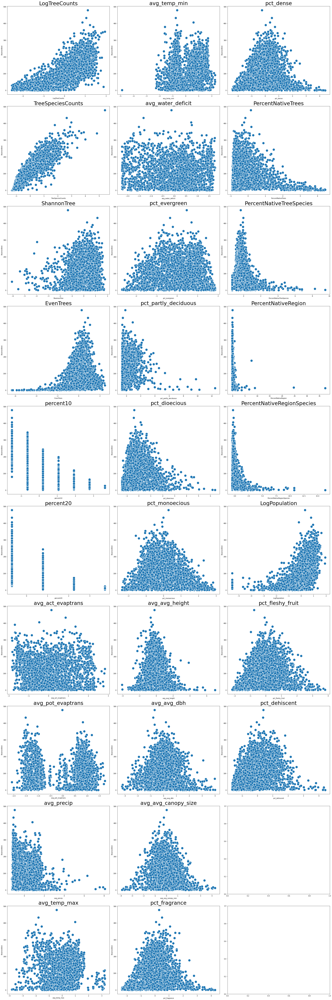

In [ ]:
colnames = X_norm.columns
colnames = colnames[colnames != "ShannonBird"]
fig,ax = plt.subplots(10,3, figsize=(30,90))
for col in [0,1,2]:
  for row in range(10):
    if col*10+row > 27:
      break
    sns.scatterplot(ax=ax[row, col], data=X_norm, y='ShannonBird', x=colnames[col*10+row], s=250)
    ax[row, col].set_title(str(colnames[col*10+row]), fontdict={'fontsize': 34, 'fontweight': 'medium'})
    #ax[row, col].set_ylim(0,500)
    #ax[row, col].set_yticks(np.arange(0,5.2,1))
    fig.tight_layout()
    fig.show()

# Testing Regression Assumptions


In [ ]:
%%bigquery --project urban-forest-269703 df_predictors
SELECT * EXCEPT(BirdCounts, TreeCounts, LogBirdCounts, BirdSpeciesCounts, 
                PercentNativeTrees, EvenBirds, LoveTrees, LoveBirds, avg_beta_richness_tree,
                avg_beta_richness_bird, avg_beta_turnover_bird, avg_beta_turnover_tree)
FROM `urban-forest-269703.treebirdagg.10km-stats`


In [ ]:
df_predictors['PercentNativeTrees'] = df_predictors['CountNativeTrees'] / np.exp(df_predictors['LogTreeCounts'])
df_predictors['PercentNativeTreeSpecies'] = df_predictors['CountNativeTreeSpecies'] / df_predictors['TreeSpeciesCounts']
df_predictors['PercentNativeRegion'] = df_predictors['nativeTree'] / np.exp(df_predictors['LogTreeCounts'])
df_predictors['PercentNativeRegionSpecies'] = df_predictors['nativeSpecies'] / df_predictors['TreeSpeciesCounts']
df_predictors['LogPopulation'] = np.log(df_predictors['Population'] + 1)
df_predictors['pct_fleshy_fruit'] = df_predictors['cnt_fleshy_fruit'] / (df_predictors['cnt_fleshy_fruit'] + df_predictors['cnt_dehiscent'] + df_predictors['cnt_indehiscent'])
df_predictors['pct_dehiscent'] = df_predictors['cnt_dehiscent'] / (df_predictors['cnt_fleshy_fruit'] + df_predictors['cnt_dehiscent'] + df_predictors['cnt_indehiscent'])
df_predictors['pct_indehiscent'] = df_predictors['cnt_indehiscent'] / (df_predictors['cnt_fleshy_fruit'] + df_predictors['cnt_dehiscent'] + df_predictors['cnt_indehiscent'])

df_predictors['geometry'] = df_predictors['geom'].apply(wkt.loads)

y = np.exp(df_predictors['ShannonBird'])
X = df_predictors.drop(['ID', 'geom', 'ShannonBird', 'geometry', 'pct_deciduous', "avg_act_evaptrans",
                  'pct_perfect_flowers', 'CountNativeTrees', 'CountNativeTreeSpecies',
                  'nativeTree', 'nativeSpecies', 'cnt_fleshy_fruit', 'cnt_dehiscent',
                  'cnt_indehiscent', 'pct_indehiscent', 'Population'], axis=1)

X_norm=(X-X.mean())/X.std()

X_geo = pd.concat([X_norm, df_predictors['geometry']], axis=1)
X_gdf = gpd.GeoDataFrame(X_geo, geometry='geometry')

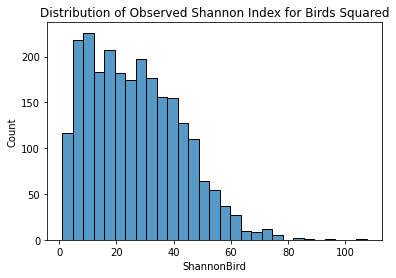

In [ ]:
sns.histplot(y)
plt.title("Distribution of Observed Shannon Index for Birds Squared")
plt.show()

## Multicolinearity

In [ ]:
corre = []
combo = []
colnames = X_norm.columns

for i in range(len(colnames)):
  for j in range(i+1, len(colnames)):
    combo.append(str(colnames[i]) + "/" + str(colnames[j]))
    corre.append(np.corrcoef(X_norm[colnames[i]], X_norm[colnames[j]])[0][1])

colinearity = pd.DataFrame({"Predictors":combo, "Correlations":corre})

In [ ]:
colinearity[np.abs(colinearity["Correlations"]) > .7]

,Predictors,Correlations
0,LogTreeCounts/TreeSpeciesCounts,0.827607
143,avg_pot_evaptrans/avg_temp_min,0.807596
330,PercentNativeTrees/PercentNativeTreeSpecies,0.741988
337,PercentNativeTreeSpecies/PercentNativeRegionSp...,0.781974


## Residual Plots

In [ ]:
%%capture
!pip install pysal
!pip install pandana

In [ ]:
from pysal.lib import weights
from pysal.explore import esda
from pysal.model import spreg

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
/usr/local/lib/python3.7/dist-packages/spaghetti/network.py:36: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(f"{dep_msg}", FutureWarning)


In [ ]:
X_gdf['centroid'] = X_gdf['geometry'].apply(lambda x: x.centroid)
X_cen = gpd.GeoDataFrame(X_gdf, geometry='centroid')

knn = weights.distance.Kernel.from_dataframe(X_cen[['centroid']], bandwidth=.06)
knn_diag = weights.insert_diagonal(knn, np.zeros(knn.n))

In [ ]:
# Spatial Lag
lagModel = spreg.GM_Lag(    
    # Dependent variable
    y.values, 
    # Independent variables
    X_norm.values,
    # Spatial weights matrix
    w=knn_diag, 
    # Dependent variable name
    name_y='ShannonBird', 
    # Independent variable name
    name_x=list(X_norm.columns)
)

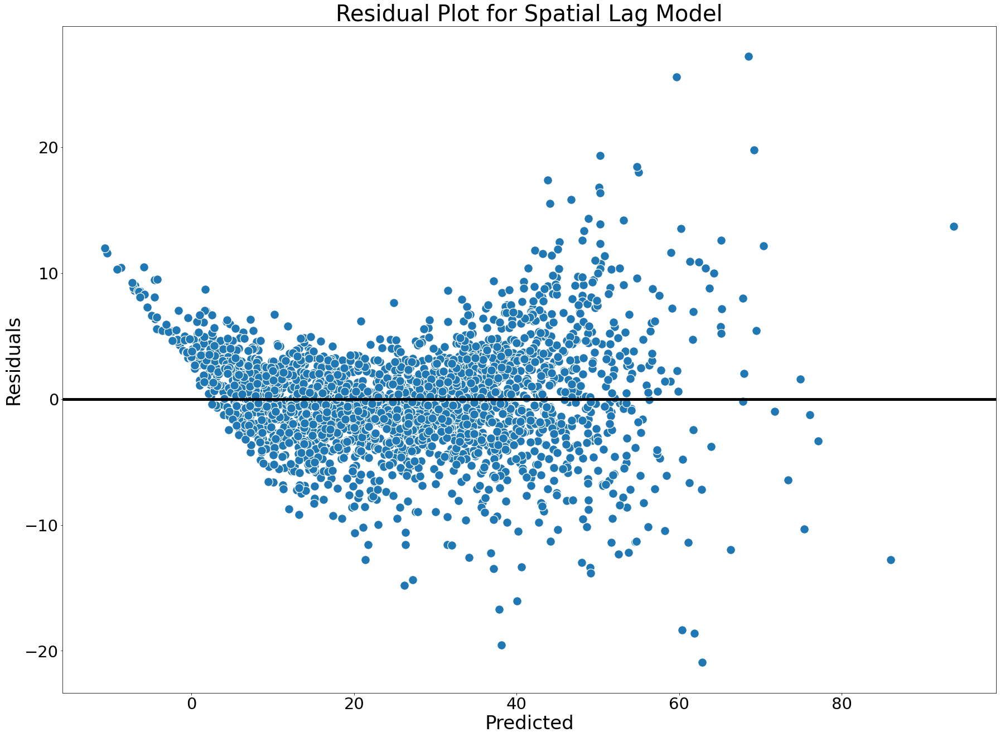

In [ ]:
spatialData = pd.DataFrame({"pred":lagModel.predy.flatten(), "resid":lagModel.u.flatten()}, )

fig,ax = plt.subplots(figsize=(30,22))
sns.scatterplot(ax=ax, data=spatialData, x='pred', y='resid', s=250)
ax.set_xlabel('Predicted', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_ylabel('Residuals', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_title('Residual Plot for Spatial Lag Model', fontdict={'fontsize': 40, 'fontweight': 'medium'})
ax.axhline(color="black", linewidth=5)
plt.xticks(fontsize=29)
plt.yticks(fontsize=29)
fig.show()

In [ ]:
# Fit spatial error model with `spreg` 
# (GMM estimation allowing for heteroskedasticity)
errorModel = spreg.GM_Error_Het(    
    # Dependent variable
    y.values, 
    # Independent variables
    X_norm.values,
    # Spatial weights matrix
    w=knn_diag, 
    # Dependent variable name
    name_y='ShannonBird', 
    # Independent variable name
    name_x=list(X_norm.columns)
)

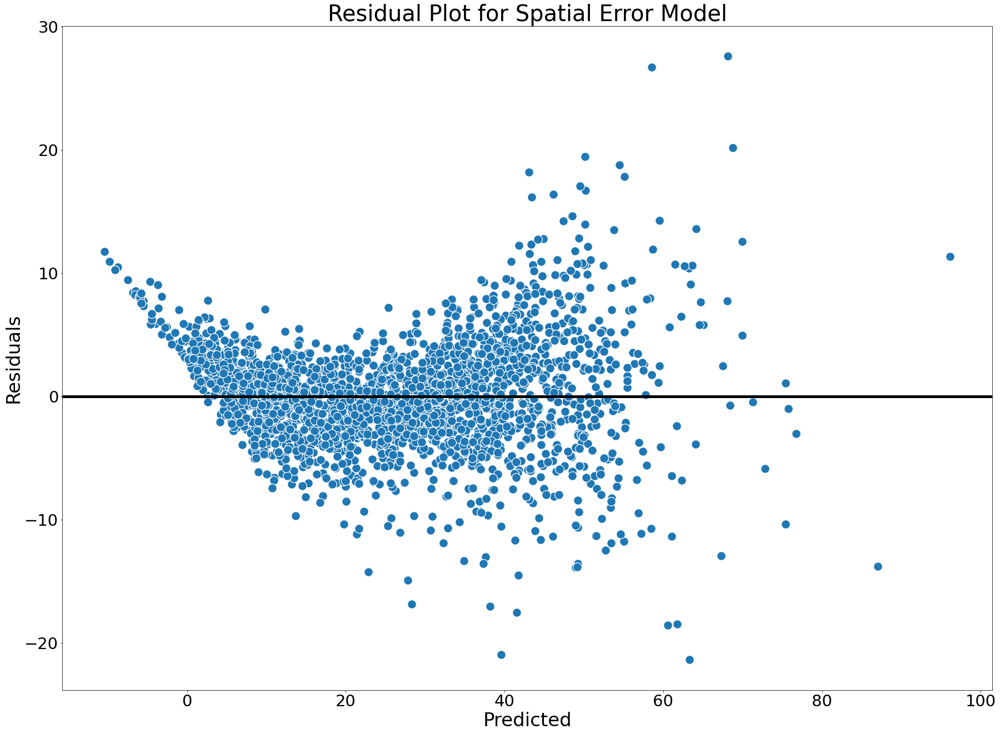

In [ ]:
spatialData = pd.DataFrame({"pred":errorModel.predy.flatten(), "resid":errorModel.u.flatten()}, )

fig,ax = plt.subplots(figsize=(30,22))
sns.scatterplot(ax=ax, data=spatialData, x='pred', y='resid', s=250)
ax.set_xlabel('Predicted', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_ylabel('Residuals', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_title('Residual Plot for Spatial Error Model', fontdict={'fontsize': 40, 'fontweight': 'medium'})
ax.axhline(color="black", linewidth=5)
plt.xticks(fontsize=29)
plt.yticks(fontsize=29)
fig.show()

## QQ-Plot

In [ ]:
%%capture
!pip install pysal
!pip install pandana

In [ ]:
from pysal.lib import weights
from pysal.explore import esda
from pysal.model import spreg
import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
/usr/local/lib/python3.7/dist-packages/spaghetti/network.py:36: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(f"{dep_msg}", FutureWarning)


In [ ]:
X_gdf['centroid'] = X_gdf['geometry'].apply(lambda x: x.centroid)
X_cen = gpd.GeoDataFrame(X_gdf, geometry='centroid')

knn = weights.distance.Kernel.from_dataframe(X_cen[['centroid']], bandwidth=.06)
knn_diag = weights.insert_diagonal(knn, np.zeros(knn.n))

In [ ]:
# Spatial Lag
lagModel = spreg.GM_Lag(    
    # Dependent variable
    y.values, 
    # Independent variables
    X_norm.values,
    # Spatial weights matrix
    w=knn_diag, 
    # Dependent variable name
    name_y='ShannonBird', 
    # Independent variable name
    name_x=list(X_norm.columns)
)

# Fit spatial error model with `spreg` 
# (GMM estimation allowing for heteroskedasticity)
errorModel = spreg.GM_Error_Het(    
    # Dependent variable
    y.values, 
    # Independent variables
    X_norm.values,
    # Spatial weights matrix
    w=knn_diag, 
    # Dependent variable name
    name_y='ShannonBird', 
    # Independent variable name
    name_x=list(X_norm.columns)
)

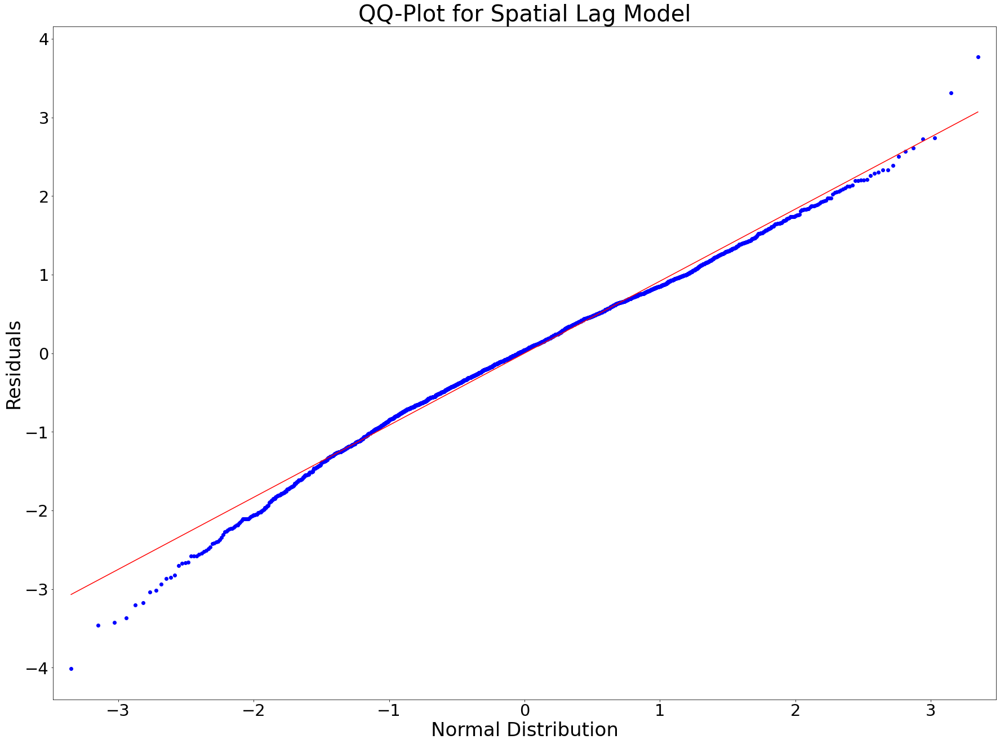

In [ ]:
# Spatial Lag
fig,ax = plt.subplots(figsize=(30,22))
sm.qqplot(lagModel.u.flatten(), line='s',ax=ax)
ax.set_xlabel('Normal Distribution', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_ylabel('Residuals', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_title('QQ-Plot for Spatial Lag Model', fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.xticks(fontsize=29)
plt.yticks(fontsize=29)
fig.show()

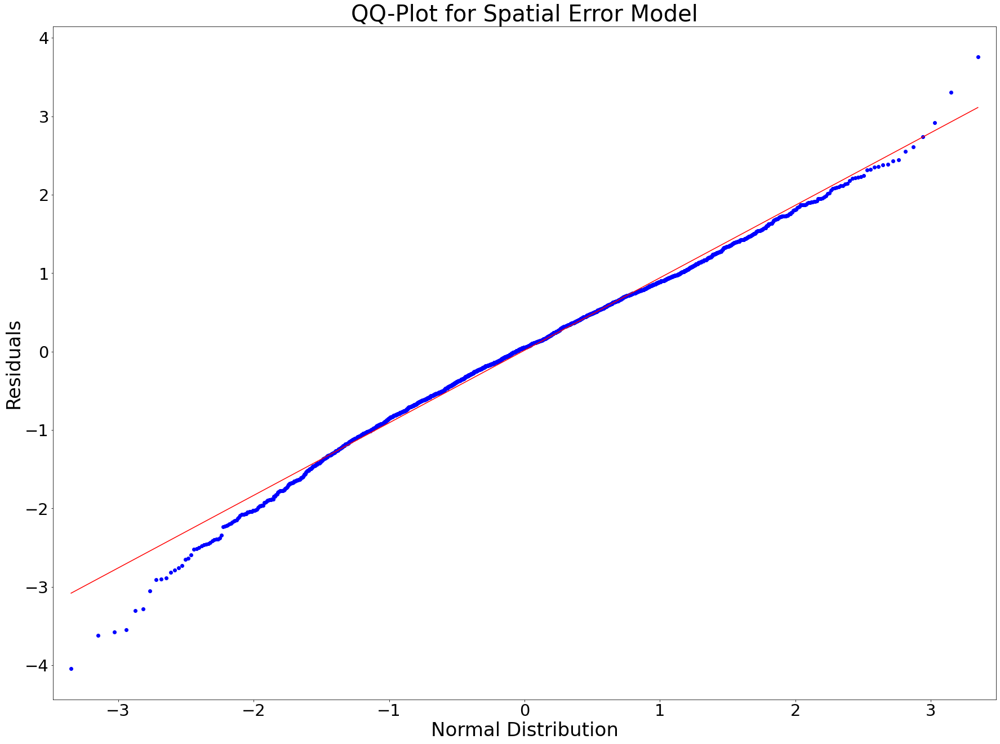

In [ ]:
# Spatial Error
fig,ax = plt.subplots(figsize=(30,22))
sm.qqplot(errorModel.u.flatten(), line='s',ax=ax)
ax.set_xlabel('Normal Distribution', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_ylabel('Residuals', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_title('QQ-Plot for Spatial Error Model', fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.xticks(fontsize=29)
plt.yticks(fontsize=29)
fig.show()

# Nativeness Regions Analysis ✓

- Proportion of Native Trees in their region
- Graph the ranges of unseen native trees (30)

## Checking for Species Name Compatibility

In [ ]:
%%bigquery --project urban-forest-269703 df_nativity
SELECT * FROM `urban-forest-269703.urbanforest.native-regions`

Could not save output to variable 'df_nativity'.

ERROR:
 ("Failed to retrieve http://metadata.google.internal/computeMetadata/v1/instance/service-accounts/default/?recursive=true from the Google Compute Enginemetadata service. Status: 404 Response:\nb''", <google.auth.transport.requests._Response object at 0x7ffb46c08a90>)


In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT DISTINCT species FROM `urban-forest-269703.trees.tree-attributes`

In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT DISTINCT species FROM `urban-forest-269703.urbanforest.final-with-grid`

In [ ]:
# Native Trees not in DataSet
native_species = df_nativity["species"]
tree_species = df_trees["species"] 
np.setdiff1d(native_species, np.intersect1d(native_species, tree_species)).size

23

In [ ]:
df_nativity.to_csv("TreeRanges2.csv", index=False)

## Adding Indicator to Tree Dataset
Get Ids of Trees who are in their Native Range


In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT species, latitude, longitude, native FROM `urban-forest-269703.trees.tree-attributes`

In [ ]:
%%bigquery --project urban-forest-269703 df_regions
SELECT * FROM `urban-forest-269703.urbanforest.native-regions`

In [ ]:
df_trees = df_trees[df_trees["species"].isin(df_regions["species"])]

In [ ]:
df_trees

,id,species,latitude,longitude
1,4845121,Pinus radiata,37.657082,-122.454088
3,3788963,Quercus engelmannii,34.031281,-117.154375
13,3941322,Populus fremontii,33.208074,-117.234831
29,4400100,Acer macrophyllum,37.658042,-121.859621
34,5905074,Populus fremontii,38.537739,-121.497610
...,...,...,...,...
7054949,6609757,Washingtonia filifera,34.071962,-118.170179
7054950,682762,Washingtonia filifera,34.441238,-119.755093
7054951,1386735,Washingtonia filifera,37.371474,-121.909919
7054952,7082110,Washingtonia filifera,34.199470,-118.154945


In [ ]:
gdf_regions = gpd.GeoDataFrame(df_regions, geometry=gpd.GeoSeries.from_wkt(df_regions.geometry), crs="EPSG:4326")
gdf_trees = gpd.GeoDataFrame(df_trees, geometry=gpd.GeoSeries.from_xy(df_trees["longitude"], df_trees["latitude"]), crs="EPSG:4326")

In [ ]:
combined = pd.merge(gdf_regions, gdf_trees, how="right", right_on="species", left_on="species")
combined.columns = ["species", "region", "id", "latitude", "longitude", "location"]
#subset = combined[combined["region"].contains(combined["location"])]

In [ ]:
#This takes like 6hrs to run : maybe a better solution?
ids = []
indx = 1
for species in combined["species"].unique():
  subset = combined[combined["species"] == species]
  treesWithin = subset[gpd.GeoSeries(subset["region"]).contains(gpd.GeoSeries(subset["location"]))]
  ids.append(treesWithin["id"].values)
  print(indx)
  indx += 1

In [ ]:
#Flatten the output from above
numpyIds = np.array([])
for entry in ids:
  if entry.size == 1:
    numpyIds = np.append(numpyIds, entry)
  elif entry.size > 1:
    for id in range(entry.size):
      numpyIds = np.append(numpyIds, entry[id])
numpyIds

array([3385737., 4315210., 5188361., ..., 5303632., 5303611., 5303612.])

In [ ]:
#Get Unique Ids
uniqueIds = np.unique(numpyIds).astype(int)
pd.DataFrame(uniqueIds).to_csv("nativeIds.csv", index=False)

In [ ]:
from google.colab import files
files.download('nativeIds.csv') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
gdf_grid = gpd.GeoDataFrame(df_grid, geometry=gpd.GeoSeries.from_wkt(df_grid.geometry), crs="EPSG:4326")

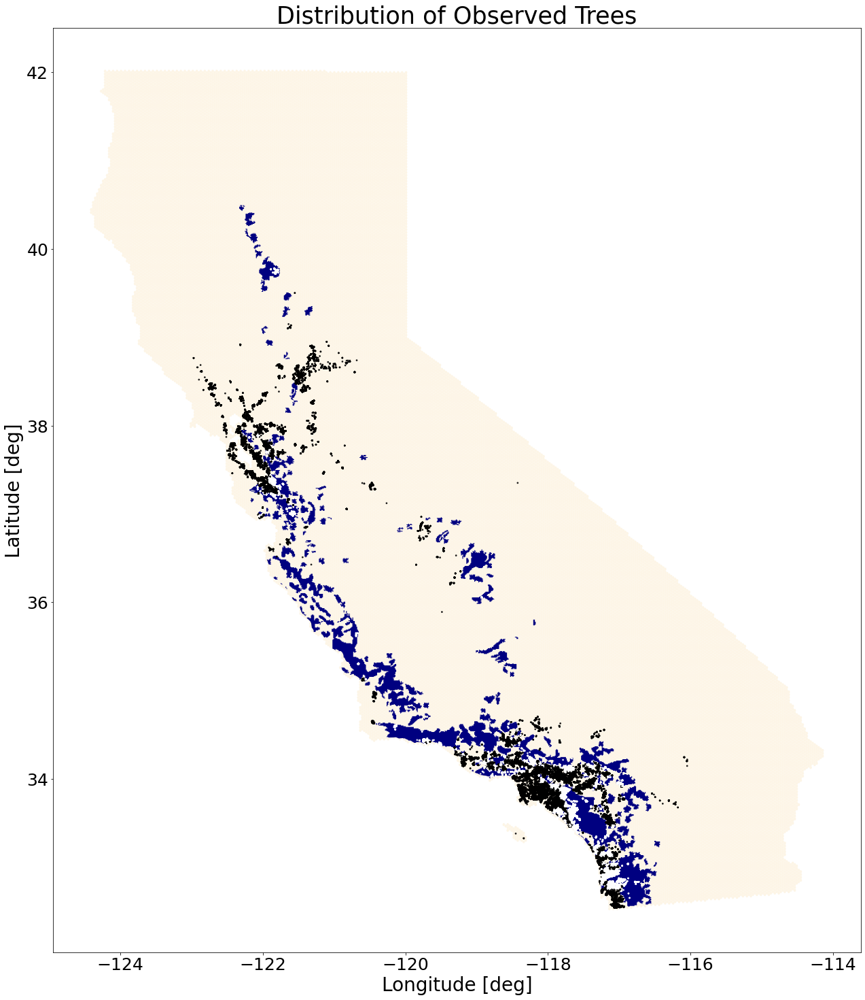

In [ ]:
#Look at specific tree species to see if the output is correct
spec = 1
gdf_region = gdf_regions[gdf_regions["species"] == combined["species"].unique()[spec]]
gdf_tree = gdf_trees[gdf_trees["species"] == combined["species"].unique()[spec]]

fig, ax = plt.subplots(figsize=(30,25))
gdf_grid.plot(ax=ax, color='oldlace') 
gdf_region.plot(ax=ax, color="navy")
gdf_tree.plot(ax=ax, column=gdf_tree["native"], markersize=3, alpha=.8, cmap="bone")

ax.set_xlabel('Longitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_ylabel('Latitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_title('Distribution of Observed Trees', 
             fontdict={'fontsize': 35, 'fontweight': 'medium'})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
fig.show()

## All Native Trees

In [ ]:
%%bigquery --project urban-forest-269703 df_grid
SELECT * FROM `urban-forest-269703.grid.ca-grid-hexagons`

In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT latitude, longitude FROM `urban-forest-269703.trees.tree-attributes`
WHERE native = 1

In [ ]:
#gdf_trees = gpd.GeoDataFrame(df_trees, geometry=gpd.GeoSeries.from_xy(df_trees["longitude"], df_trees["latitude"]))
gdf_grid = gpd.GeoDataFrame(df_grid, geometry=gpd.GeoSeries.from_wkt(df_grid["geometry"]))

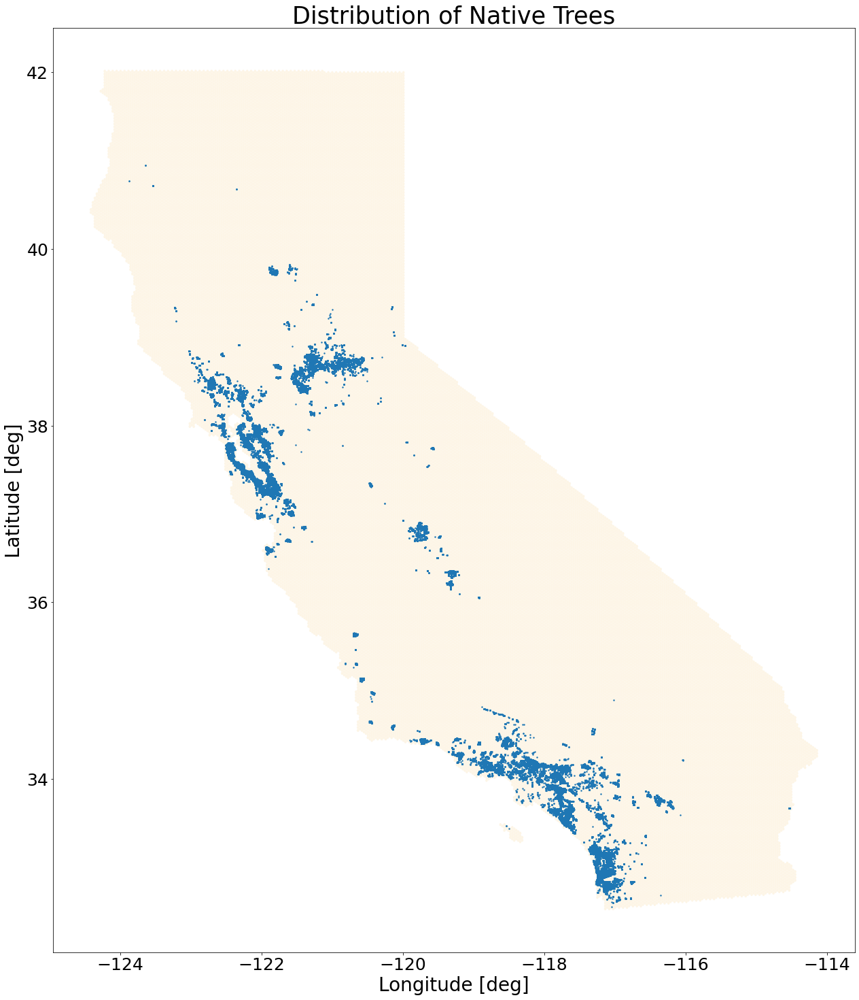

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
gdf_grid.plot(ax=ax, color='oldlace') 
gdf_trees.plot(ax=ax, markersize=2)
ax.set_xlabel('Longitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_ylabel('Latitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_title('Distribution of Native Trees', fontdict={'fontsize': 35, 'fontweight': 'medium'})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
fig.show()

## Re-Creating Ryan's Graphs

### Native Tree Counts by Grid

In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT geom, PercentNativeTrees FROM `urban-forest-269703.treebirdagg.10km-stats`

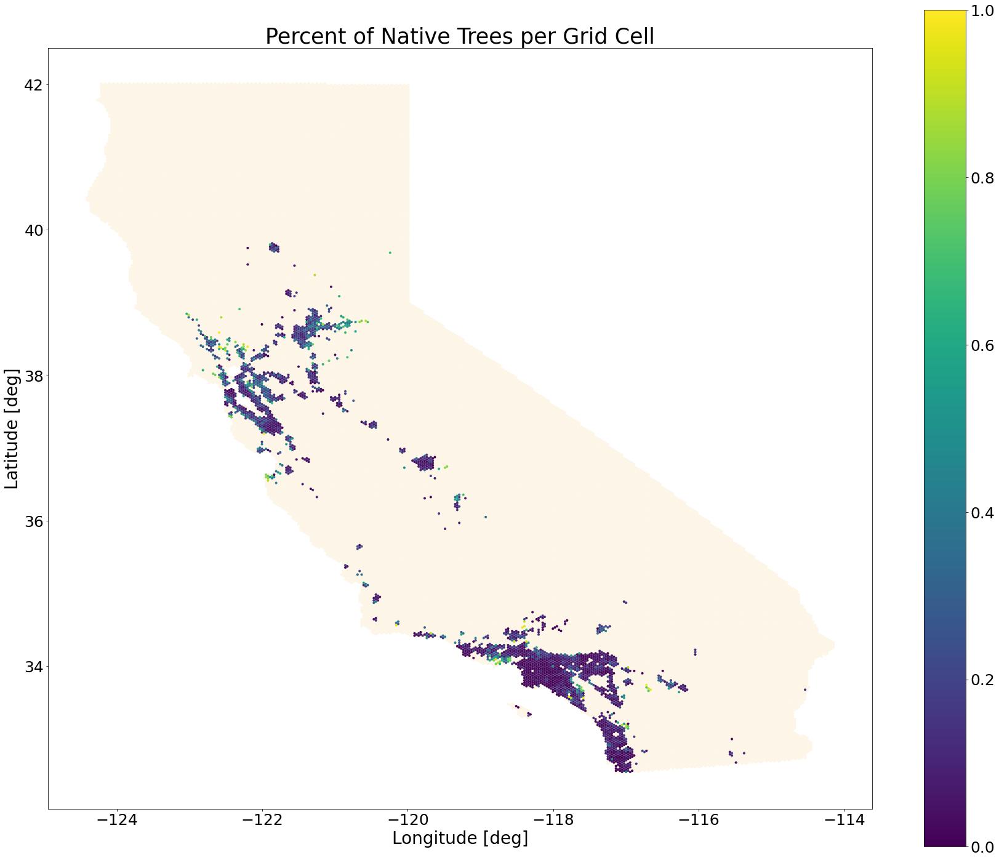

In [ ]:

gdf_graph = gpd.GeoDataFrame(df_trees, geometry=gpd.GeoSeries.from_wkt(df_trees.geom))
#gdf_graph = gdf_graph[gdf_graph["native"] > 0]
#gdf_graph['native'] = np.log(gdf_graph['native'])
#gdf_grid = gpd.GeoDataFrame(df_grid, geometry=gpd.GeoSeries.from_wkt(df_grid["geometry"]))

fig, ax = plt.subplots(figsize=(30,25))
gdf_grid.plot(ax=ax, color='oldlace')
ax2 = gdf_graph.plot(ax=ax, column=gdf_graph['PercentNativeTrees'], markersize=2, legend=True)

ax.set_xlabel('Longitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_ylabel('Latitude [deg]', fontdict={'fontsize': 28, 'fontweight': 'medium'})
ax.set_title('Percent of Native Trees per Grid Cell', fontdict={'fontsize': 35, 'fontweight': 'medium'})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
ax2.figure.axes[1].tick_params(labelsize=25)
fig.show()

### Shannon Bird by Shannon Tree with Native Counts

In [ ]:
%%bigquery --project urban-forest-269703 df_graph
SELECT ShannonBird, ShannonTree, nativeSpecies FROM `urban-forest-269703.treebirdagg.10km-final`

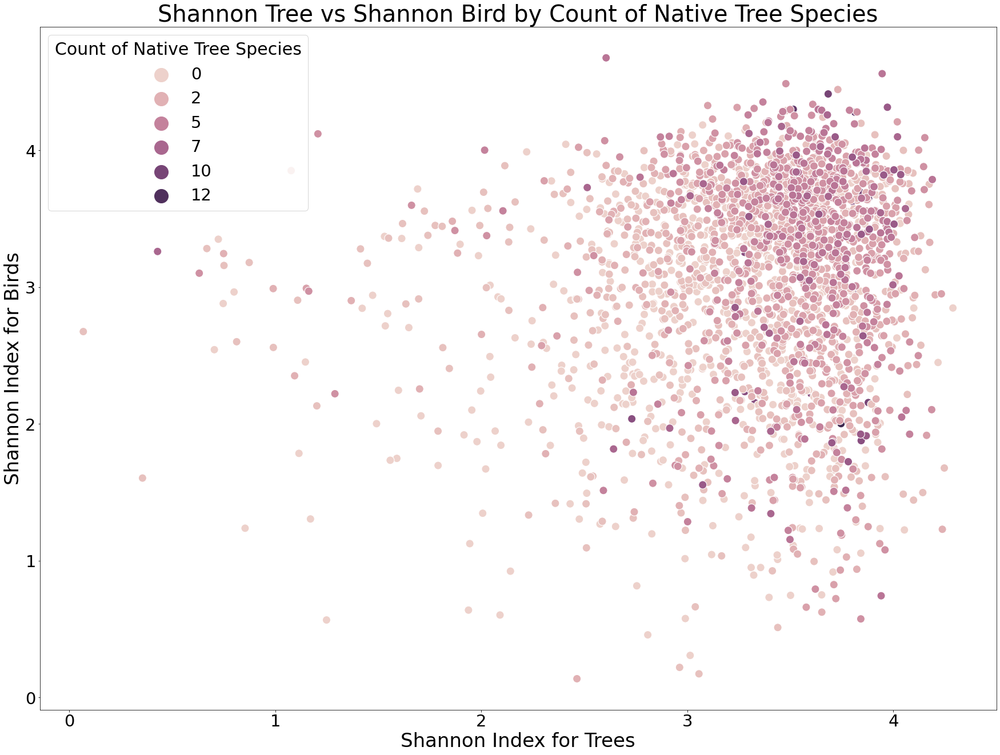

In [ ]:
fig,ax = plt.subplots(figsize=(30,22))
sns.scatterplot(ax=ax, data=df_graph, x='ShannonTree', y='ShannonBird', hue='nativeSpecies', s=200)
ax.set_xlabel('Shannon Index for Trees', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_ylabel('Shannon Index for Birds', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_title('Shannon Tree vs Shannon Bird by Count of Native Tree Species', fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.xticks(fontsize=29)
plt.yticks(fontsize=29)
plt.legend(title='Count of Native Tree Species', title_fontsize=30, markerscale=4, fontsize=29)
fig.show()

### Shannon Bird by Unique Tree Species

In [ ]:
%%bigquery --project urban-forest-269703 df_graph
SELECT ShannonBird, TreeSpeciesCounts, nativeSpecies FROM `urban-forest-269703.treebirdagg.10km-final`

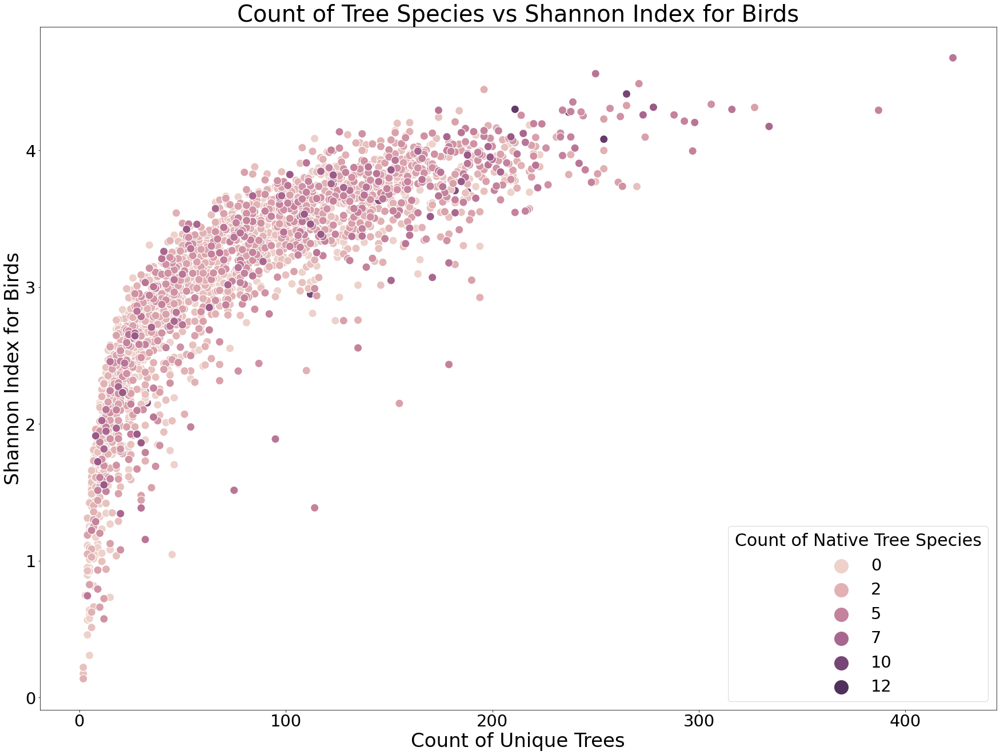

In [ ]:
fig,ax = plt.subplots(figsize=(30,22))
sns.scatterplot(ax=ax, data=df_graph, x='TreeSpeciesCounts', y='ShannonBird', hue='nativeSpecies', s=200)
ax.set_xlabel('Count of Unique Trees', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_ylabel('Shannon Index for Birds', fontdict={'fontsize': 34, 'fontweight': 'medium'})
ax.set_title('Count of Tree Species vs Shannon Index for Birds', fontdict={'fontsize': 40, 'fontweight': 'medium'})
plt.xticks(fontsize=29)
plt.yticks(fontsize=29)
plt.legend(title='Count of Native Tree Species', title_fontsize=30, markerscale=4, fontsize=29)
fig.show()

# Diversity Scatter Plots
Look into FacetGrid

In [ ]:
%%bigquery --project urban-forest-269703 df_diversity
SELECT * FROM `urban-forest-269703.treebirdagg.10-km-stats-main`

## Trees

In [ ]:
tree_diversity = df_diversity[df_diversity["TreeCounts"] > 20]
tree_diversity["TreeBin"].loc[tree_diversity["TreeCounts"] > 20] = "Low"
tree_diversity["TreeBin"].loc[tree_diversity["TreeCounts"] > 250] = "Medium"
tree_diversity["TreeBin"].loc[tree_diversity["TreeCounts"] > 2500] = "High"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:
correlations = tree_diversity.groupby("TreeBin")[["ShannonTree","EvenTrees"]].corr().reset_index(level=1)["ShannonTree"]
correlations = correlations[correlations < 1]

0.07272359226757336

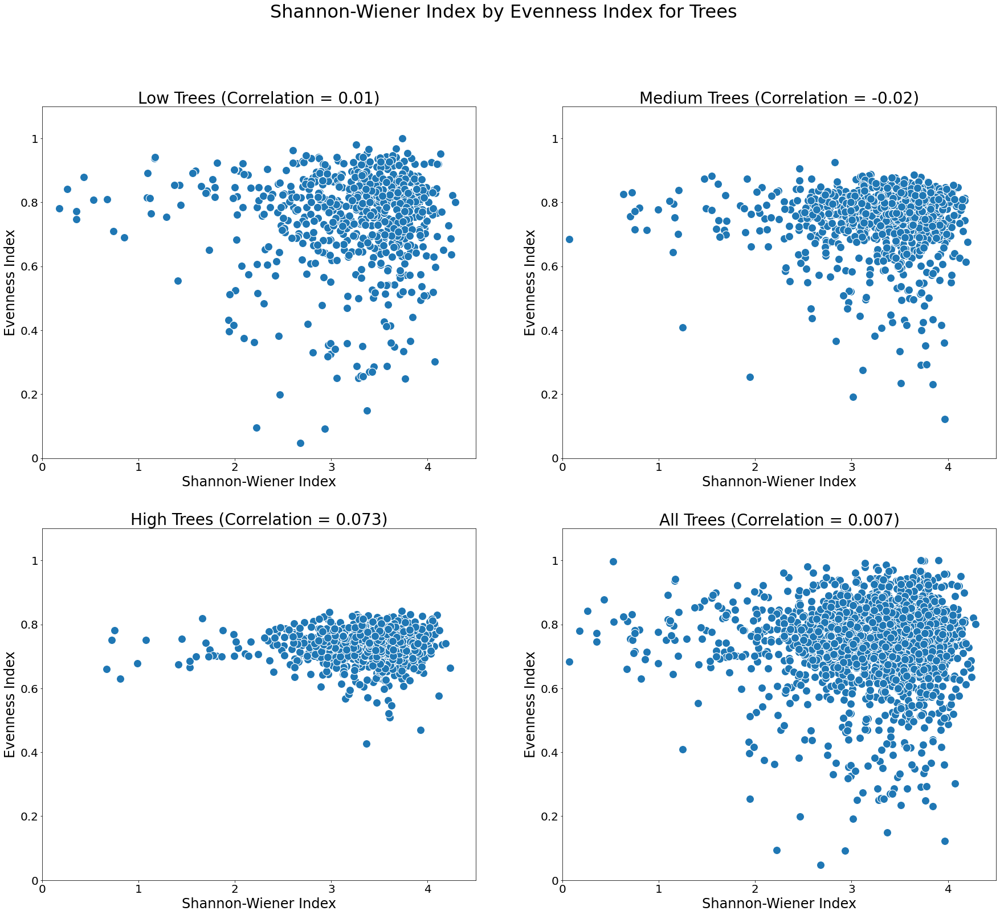

In [ ]:
# Trees: Shannon - Eveness
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Shannon-Wiener Index by Evenness Index for Trees", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["TreeBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["TreeBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset.ShannonTree), np.ma.masked_invalid(subset.EvenTrees))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='ShannonTree', y='EvenTrees', s=200)
    axs[row, col].set_xlabel('Shannon-Wiener Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('Evenness Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Trees (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(0,4.5)
    axs[row, col].set_ylim(0,1.1)
    axs[row, col].set_xticks(np.arange(0,5))
    axs[row, col].set_yticks(np.arange(0,1.2,.2))
    axs[row, col].set_xticklabels(labels=[0,1,2,3,4], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,.2,.4,.6,.8,1], fontdict={'fontsize': 20, 'fontweight': 'medium'})

fig.show()

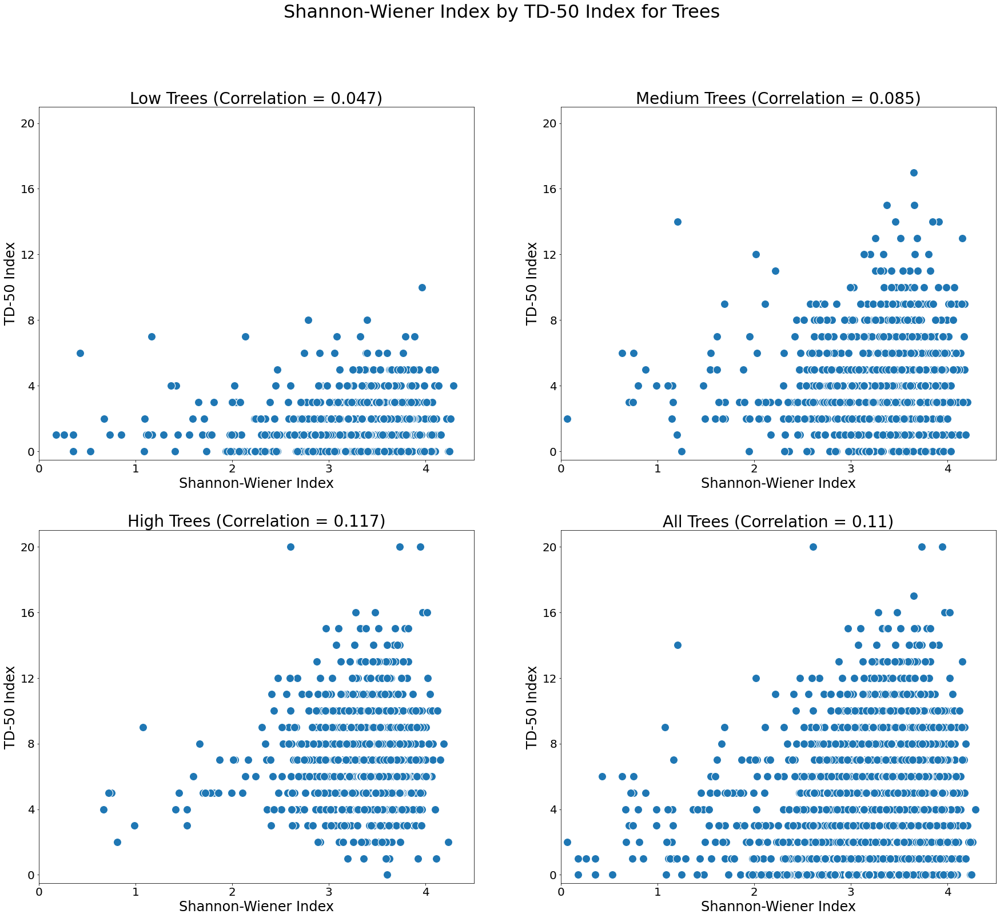

In [ ]:
# Trees : Shannon - Love
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Shannon-Wiener Index by TD-50 Index for Trees", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["TreeBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["TreeBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset.ShannonTree), np.ma.masked_invalid(subset.LoveTrees))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='ShannonTree', y='LoveTrees', s=200)
    axs[row, col].set_xlabel('Shannon-Wiener Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('TD-50 Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Trees (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(0,4.5)
    axs[row, col].set_ylim(-.5,21)
    axs[row, col].set_xticks(np.arange(0,5))
    axs[row, col].set_yticks(np.arange(0,21,4))
    axs[row, col].set_xticklabels(labels=[0,1,2,3,4], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,4,8,12,16,20], fontdict={'fontsize': 20, 'fontweight': 'medium'})

fig.show()

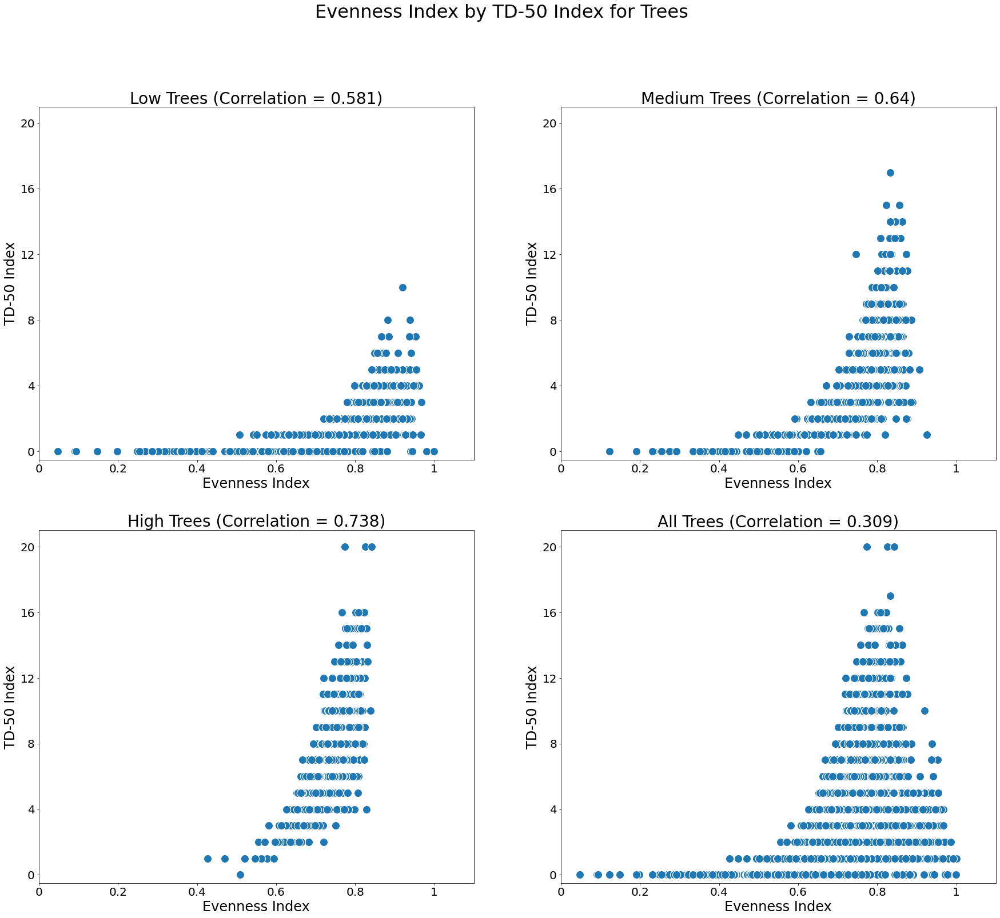

In [ ]:
# Tree : Even - Love
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Evenness Index by TD-50 Index for Trees", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["TreeBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["TreeBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset.EvenTrees), np.ma.masked_invalid(subset.LoveTrees))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='EvenTrees', y='LoveTrees', s=200)
    axs[row, col].set_xlabel('Evenness Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('TD-50 Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Trees (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(0,1.1)
    axs[row, col].set_ylim(-.5,21)
    axs[row, col].set_yticks(np.arange(0,21,4))
    axs[row, col].set_xticks(np.arange(0,1.2,.2))
    axs[row, col].set_xticklabels(labels=[0,.2,.4,.6,.8,1], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,4,8,12,16,20], fontdict={'fontsize': 20, 'fontweight': 'medium'})

fig.show()

## Birds

Get the Distributions from the ViolinPlots of Bird Measures

In [ ]:
df_diversity = pd.merge(pd.merge(shannon_index, love_birds, right_on="grid", left_on="grid", how="inner"), 
                        evenness_index, right_on="grid", left_on="grid", how="inner")
df_diversity = df_diversity[["grid", "count_y", "Shannon-Wiener", "LoveBirds", "EvenBirds"]]

In [ ]:
df_diversity["BirdBin"] = "None"
df_diversity["BirdBin"].loc[df_diversity["count_y"] > 80] = "Low"
df_diversity["BirdBin"].loc[df_diversity["count_y"] >= 485] = "Medium"
df_diversity["BirdBin"].loc[df_diversity["count_y"] >= 3803] = "High"
df_diversity = df_diversity[df_diversity["BirdBin"] != "None"]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


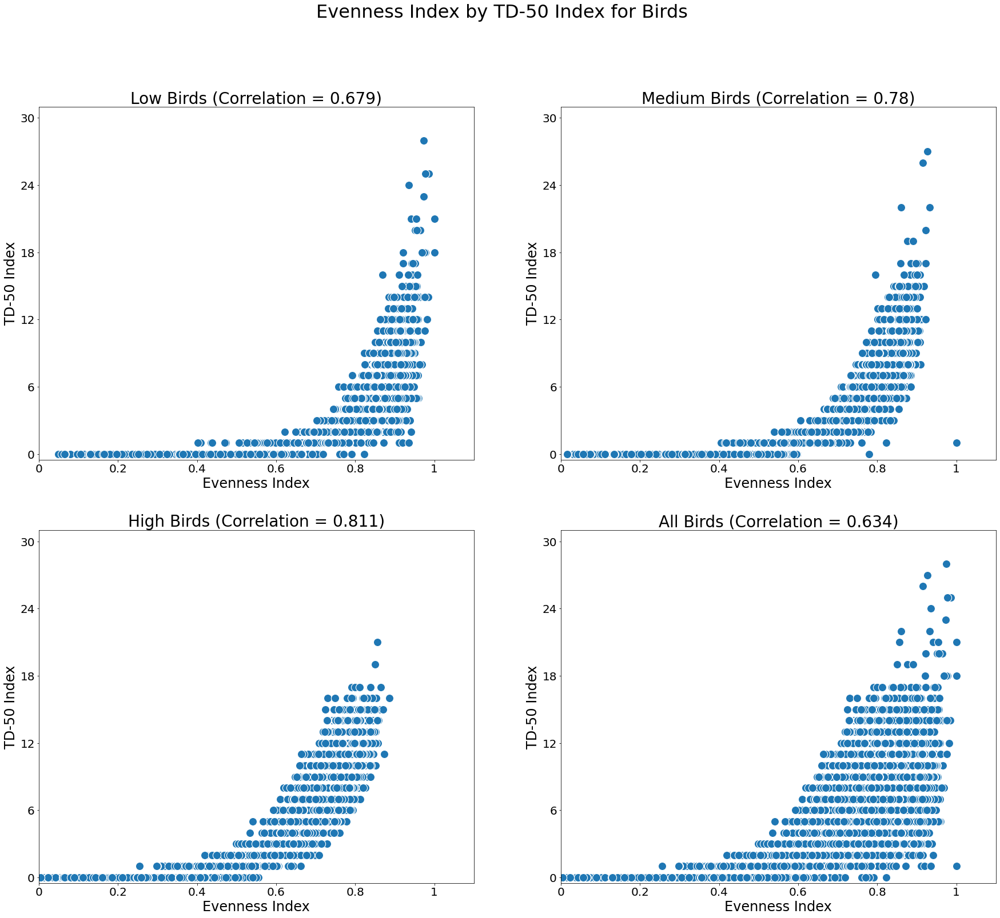

In [ ]:
# Bird : Even - Love
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Evenness Index by TD-50 Index for Birds", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["BirdBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["BirdBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset.EvenBirds), np.ma.masked_invalid(subset.LoveBirds))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='EvenBirds', y='LoveBirds', s=200)
    axs[row, col].set_xlabel('Evenness Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('TD-50 Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Birds (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_ylim(-.5,31)
    axs[row, col].set_xlim(0,1.1)
    axs[row, col].set_yticks(np.arange(0,31, 6))
    axs[row, col].set_xticks(np.arange(0,1.2,.2))
    axs[row, col].set_yticklabels(labels=[0,6,12,18,24,30], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_xticklabels(labels=[0,.2,.4,.6,.8,1], fontdict={'fontsize': 20, 'fontweight': 'medium'})

fig.show()

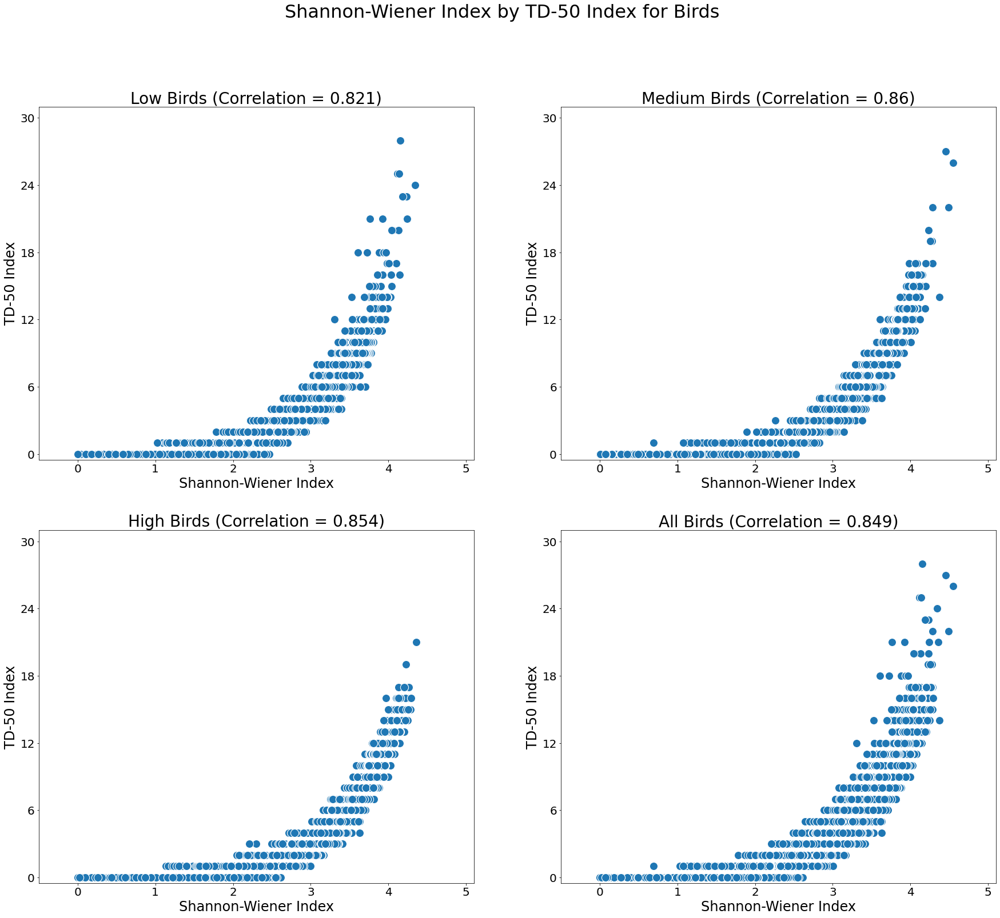

In [ ]:
# Bird : Shannon - Love
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Shannon-Wiener Index by TD-50 Index for Birds", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["BirdBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["BirdBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset["Shannon-Wiener"]), np.ma.masked_invalid(subset.LoveBirds))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='Shannon-Wiener', y='LoveBirds', s=200)
    axs[row, col].set_xlabel('Shannon-Wiener Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('TD-50 Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Birds (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(-.5,5.1)
    axs[row, col].set_ylim(-.5,31)
    axs[row, col].set_xticks(np.arange(0,6))
    axs[row, col].set_yticks(np.arange(0,31,6))
    axs[row, col].set_xticklabels(labels=[0,1,2,3,4,5], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,6,12,18,24,30], fontdict={'fontsize': 20, 'fontweight': 'medium'})

fig.show()

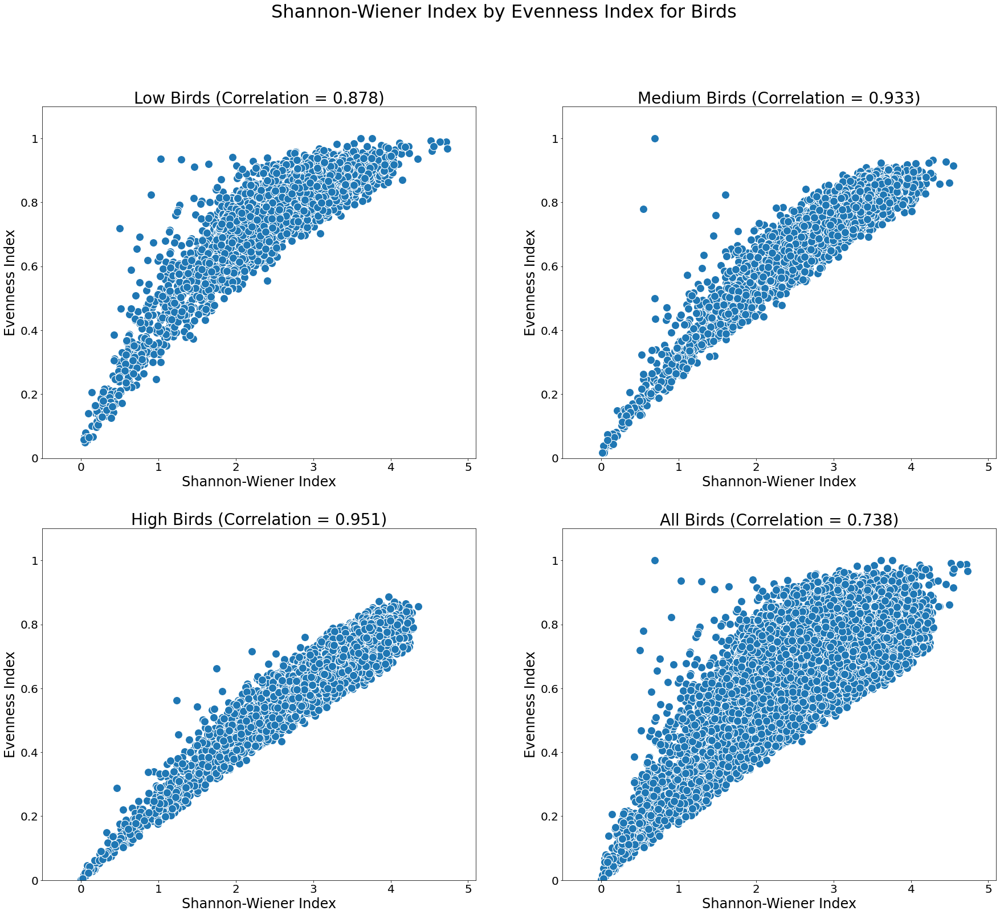

In [ ]:
# Bird : Shannon - Even
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Shannon-Wiener Index by Evenness Index for Birds", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["BirdBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["BirdBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset["Shannon-Wiener"]), np.ma.masked_invalid(subset.EvenBirds))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='Shannon-Wiener', y='EvenBirds', s=200)
    axs[row, col].set_xlabel('Shannon-Wiener Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('Evenness Index', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Birds (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(-.5,5.1)
    axs[row, col].set_ylim(0,1.1)
    axs[row, col].set_xticks(np.arange(0,6))
    axs[row, col].set_yticks(np.arange(0,1.2,.2))
    axs[row, col].set_xticklabels(labels=[0,1,2,3,4,5], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,.2,.4,.6,.8,1], fontdict={'fontsize': 20, 'fontweight': 'medium'})

fig.show()

## Same Measures

In [ ]:
%%bigquery --project urban-forest-269703 df_diversity
SELECT * FROM `urban-forest-269703.treebirdagg.10-km-stats-main`

In [ ]:
df_diversity["PopBin"] = "None"
df_diversity["PopBin"].loc[df_diversity["Population"] > 0] = "Low"
df_diversity["PopBin"].loc[df_diversity["Population"] >= 13.63] = "Medium"
df_diversity["PopBin"].loc[df_diversity["Population"] >= 185.81] = "High"
df_diversity = df_diversity[df_diversity["PopBin"] != "None"]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


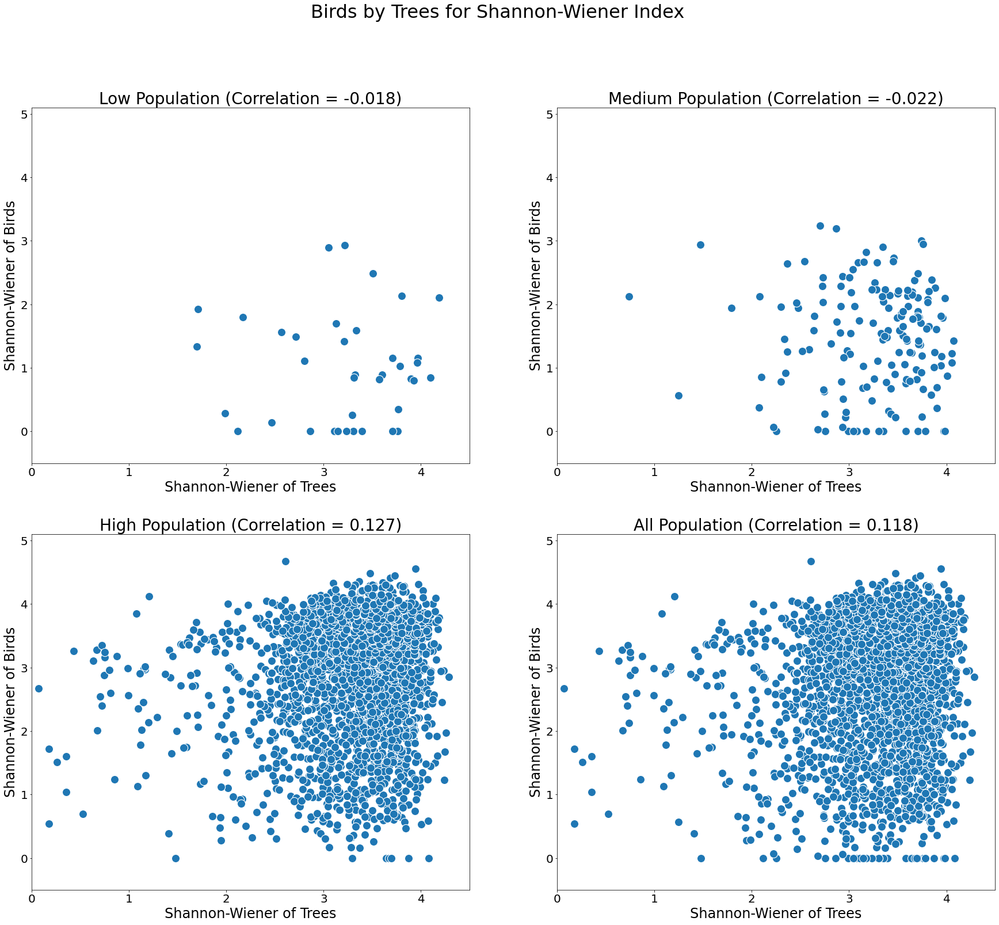

In [ ]:
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Birds by Trees for Shannon-Wiener Index", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["PopBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["PopBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset.ShannonTree), np.ma.masked_invalid(subset.ShannonBird))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='ShannonTree', y='ShannonBird', s=200)
    axs[row, col].set_xlabel('Shannon-Wiener of Trees', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('Shannon-Wiener of Birds', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Population (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(0,4.5)
    axs[row, col].set_ylim(-.5,5.1)
    axs[row, col].set_xticks(np.arange(0,5))
    axs[row, col].set_yticks(np.arange(0,6))
    axs[row, col].set_xticklabels(labels=[0,1,2,3,4], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,1,2,3,4,5], fontdict={'fontsize': 20, 'fontweight': 'medium'})

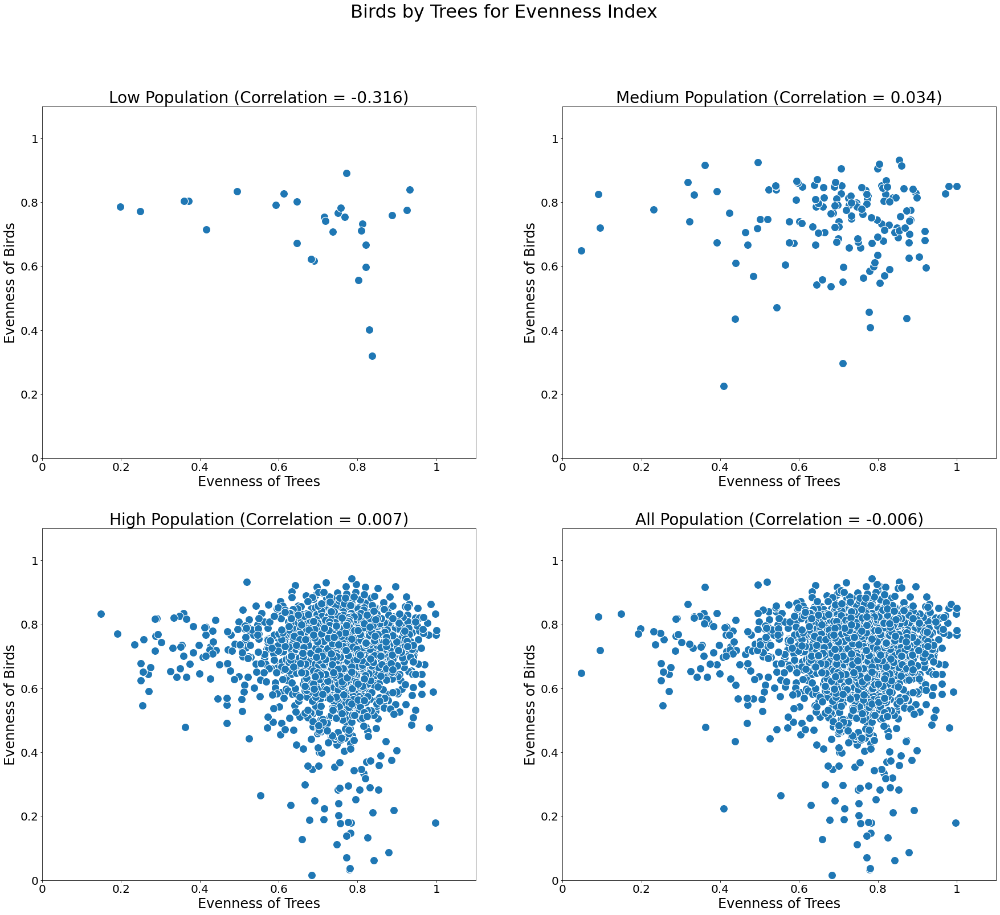

In [ ]:
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Birds by Trees for Evenness Index", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["PopBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["PopBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset.EvenTrees), np.ma.masked_invalid(subset.EvenBirds))[0][1], 3)
    sns.scatterplot(ax=axs[row, col], data=subset, x='EvenTrees', y='EvenBirds', s=200)
    axs[row, col].set_xlabel('Evenness of Trees', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('Evenness of Birds', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Population (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(0,1.1)
    axs[row, col].set_ylim(0,1.1)
    axs[row, col].set_xticks(np.arange(0,1.2,.2))
    axs[row, col].set_yticks(np.arange(0,1.2,.2))
    axs[row, col].set_xticklabels(labels=[0,.2,.4,.6,.8,1], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,.2,.4,.6,.8,1], fontdict={'fontsize': 20, 'fontweight': 'medium'})

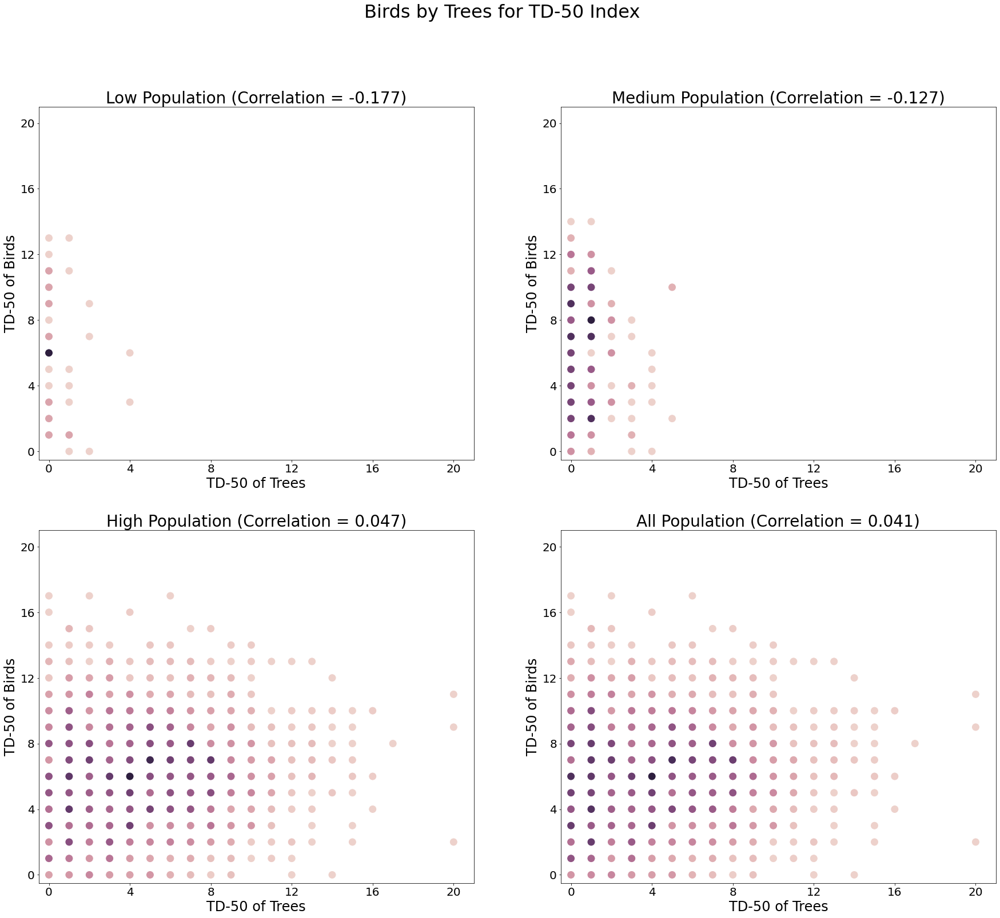

In [ ]:
levels = ["Low", "Medium", "High", "All"]
fig, axs = plt.subplots(2,2, figsize=(30,25))
fig.suptitle("Birds by Trees for TD-50 Index", fontsize=32, fontweight='medium')
for col in [0,1]:
  for row in [0,1]:
    if col == 1 & row == 1:
      subset = df_diversity[df_diversity["PopBin"] != "None"]
    else:
      subset = df_diversity[df_diversity["PopBin"] == levels[2*row + col]]
    cor = round(np.ma.corrcoef(np.ma.masked_invalid(subset.LoveTrees), np.ma.masked_invalid(subset.LoveBirds))[0][1], 3)

    counts = subset.groupby(["LoveBirds", "LoveTrees"]).count().reset_index()

    points = sns.scatterplot(ax=axs[row, col], data=counts, x='LoveTrees', y='LoveBirds', s=200, c=counts["ID"], cmap=sns.cubehelix_palette(as_cmap=True))
    axs[row, col].set_xlabel('TD-50 of Trees', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_ylabel('TD-50 of Birds', fontdict={'fontsize': 24, 'fontweight': 'medium'})
    axs[row, col].set_title(str(levels[2*row + col]) + ' Population (Correlation = ' + str(cor) + ')', fontdict={'fontsize': 28, 'fontweight': 'medium'})
    axs[row, col].set_xlim(-.5,21)
    axs[row, col].set_ylim(-.5,21)
    axs[row, col].set_xticks(np.arange(0,21,4))
    axs[row, col].set_yticks(np.arange(0,21,4))
    axs[row, col].set_xticklabels(labels=[0,4,8,12,16,20], fontdict={'fontsize': 20, 'fontweight': 'medium'})
    axs[row, col].set_yticklabels(labels=[0,4,8,12,16,20], fontdict={'fontsize': 20, 'fontweight': 'medium'})

In [ ]:
counts

,LoveBirds,LoveTrees,ID,geometry,BirdCounts,TreeCounts,LogBirdCounts,LogTreeCounts,TreeSpeciesCounts,BirdSpeciesCounts,...,PercentNativeTrees,CountNativeTreeSpecies,ShannonTree,ShannonBird,EvenTrees,EvenBirds,Population,percent10,percent20,PopBin
0,0.0,0.0,13,13,13,13,13,13,13,13,...,13,13,13,13,12,13,13,13,13,13
1,0.0,1.0,15,15,15,15,15,15,15,15,...,15,15,15,15,15,15,15,15,15,15
2,0.0,2.0,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,16
3,0.0,3.0,12,12,12,12,12,12,12,12,...,12,12,12,12,12,12,12,12,12,12
4,0.0,4.0,11,11,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,16.0,0.0,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
220,16.0,4.0,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
221,17.0,0.0,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
222,17.0,2.0,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


# Tree/Bird/Population Bins : Histograms / Violin Plots

## Trees

In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT 
  grid, count(species) as count
FROM `urban-forest-269703.urbanforest.final-with-grid`
GROUP BY grid
having count(grid) >= 20 

In [ ]:
trees_combined = pd.merge(df_grid, df_trees, left_on="ID", right_on="grid", how="right")

In [ ]:
gdf_trees = gpd.GeoDataFrame(trees_combined, geometry=gpd.GeoSeries.from_wkt(trees_combined.geometry), crs="EPSG:4326")

In [ ]:
hist = np.histogram(df_trees["count"], bins = np.arange(0,25000,250))
print(hist[0].sum() // 3)
hist

930


(array([783, 262, 155, 119, 119,  93,  68,  77,  74,  68,  56,  63,  56,
         65,  54,  50,  45,  44,  32,  36,  30,  22,  36,  37,  33,  30,
         23,  23,  18,  22,  16,  16,   9,  12,  10,  13,  11,  11,   8,
         12,   8,   8,   3,   6,   8,   3,   8,   2,   6,   5,   1,   2,
          2,   2,   1,   0,   1,   1,   1,   2,   1,   1,   0,   0,   1,
          0,   0,   0,   1,   0,   0,   1,   0,   0,   1,   0,   0,   0,
          1,   0,   0,   0,   0,   1,   0,   0,   0,   0,   1,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   1]),
 array([    0,   250,   500,   750,  1000,  1250,  1500,  1750,  2000,
         2250,  2500,  2750,  3000,  3250,  3500,  3750,  4000,  4250,
         4500,  4750,  5000,  5250,  5500,  5750,  6000,  6250,  6500,
         6750,  7000,  7250,  7500,  7750,  8000,  8250,  8500,  8750,
         9000,  9250,  9500,  9750, 10000, 10250, 10500, 10750, 11000,
        11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250,
        13500

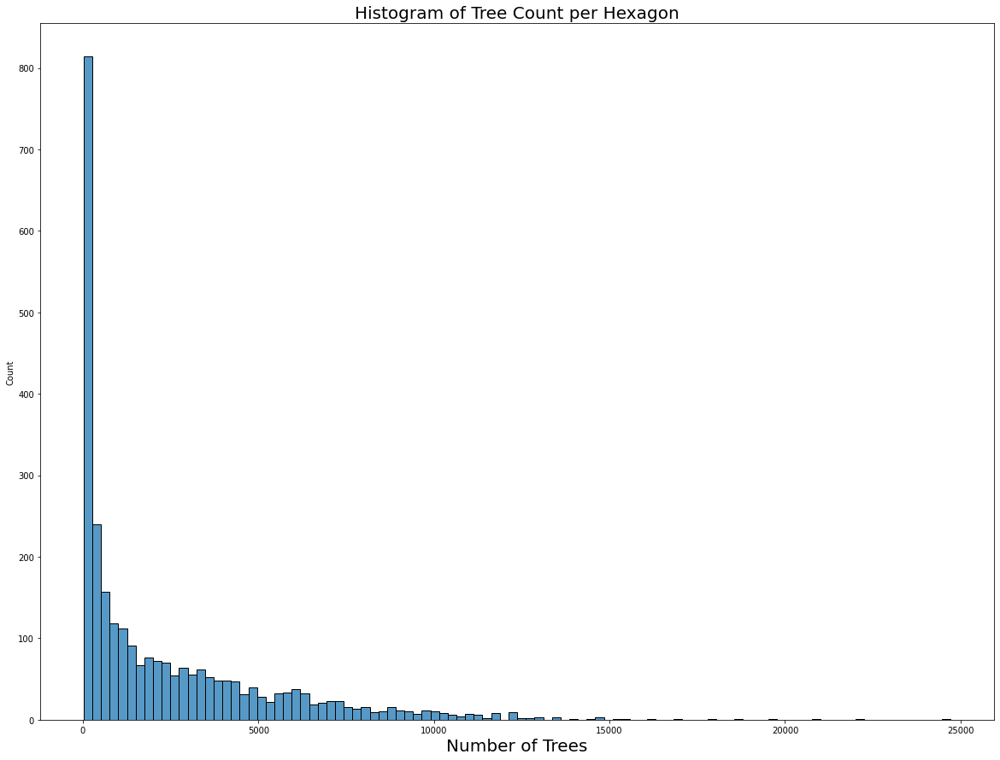

In [ ]:
fig, ax = plt.subplots(figsize=(20,15))
sns.histplot(df_trees, x="count", bins=100)
ax.set_xlabel("Number of Trees", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Histogram of Tree Count per Hexagon", fontdict={"fontsize":20, "fontweight":"medium"})
fig.show()

In [ ]:
df_trees["bin"] = "[10-250]"
df_trees["bin"].loc[df_trees["count"] > 250] = "(250-2,500]"
df_trees["bin"].loc[df_trees["count"] > 2500] = "(2500-25,000]"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


### Shannon-Weiner Violin Plots

In [ ]:
%%bigquery --project urban-forest-269703 df_diversity
SELECT * FROM `urban-forest-269703.treebirdagg.10-km-stats-main`

In [ ]:
df_diversity["TreeBin"] = "[20-250]"
df_diversity["TreeBin"].loc[df_diversity["TreeCounts"] > 250] = "(250-2,500]"
df_diversity["TreeBin"].loc[df_diversity["TreeCounts"] > 2500] = "(2500-25,000]"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


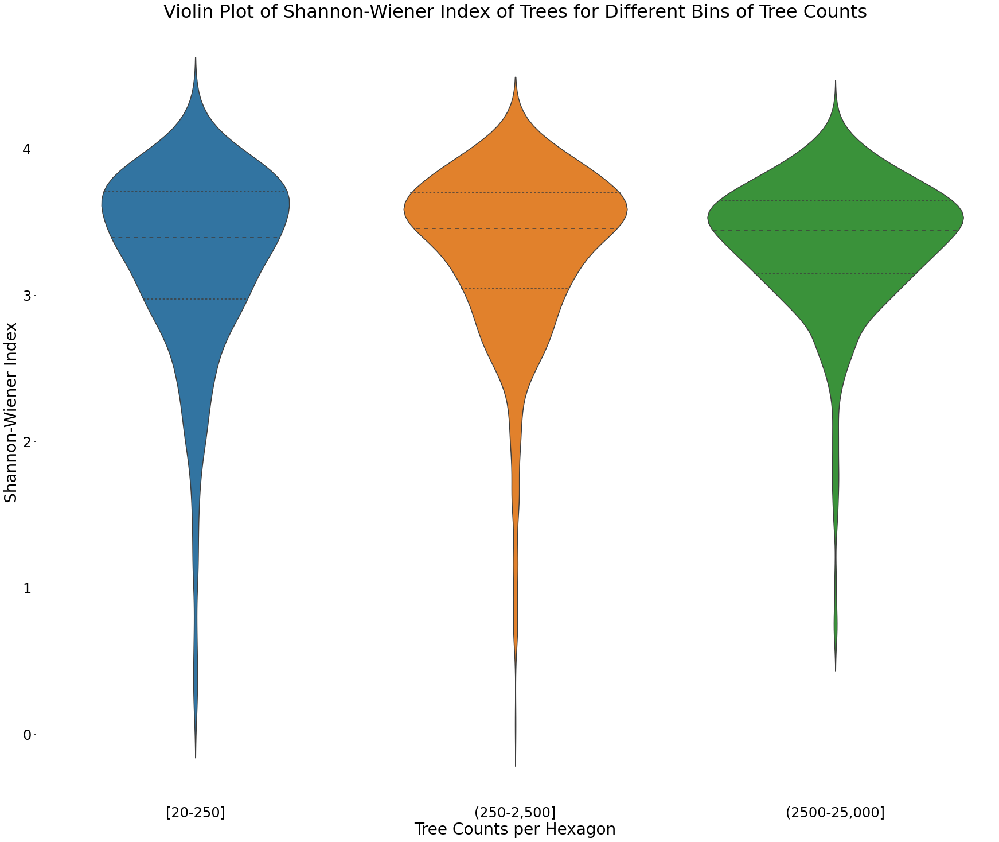

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=df_diversity["TreeBin"], y=df_diversity["ShannonTree"], order=["[20-250]", "(250-2,500]", "(2500-25,000]"], inner="quartile")
ax.set_ylabel("Shannon-Wiener Index", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Tree Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of Shannon-Wiener Index of Trees for Different Bins of Tree Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

### Evenness Box Plots

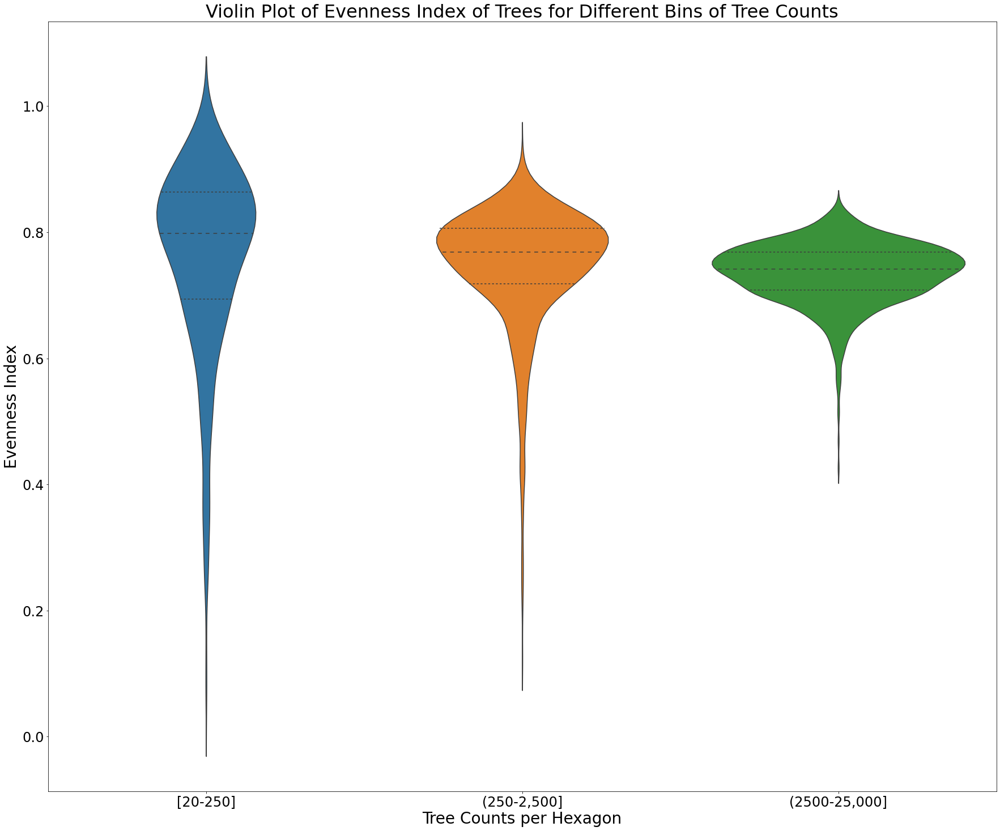

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=df_diversity["TreeBin"], y=df_diversity["EvenTrees"], order=["[20-250]", "(250-2,500]", "(2500-25,000]"], inner="quartile")
ax.set_ylabel("Evenness Index", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Tree Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of Evenness Index of Trees for Different Bins of Tree Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

### Love Box Plots

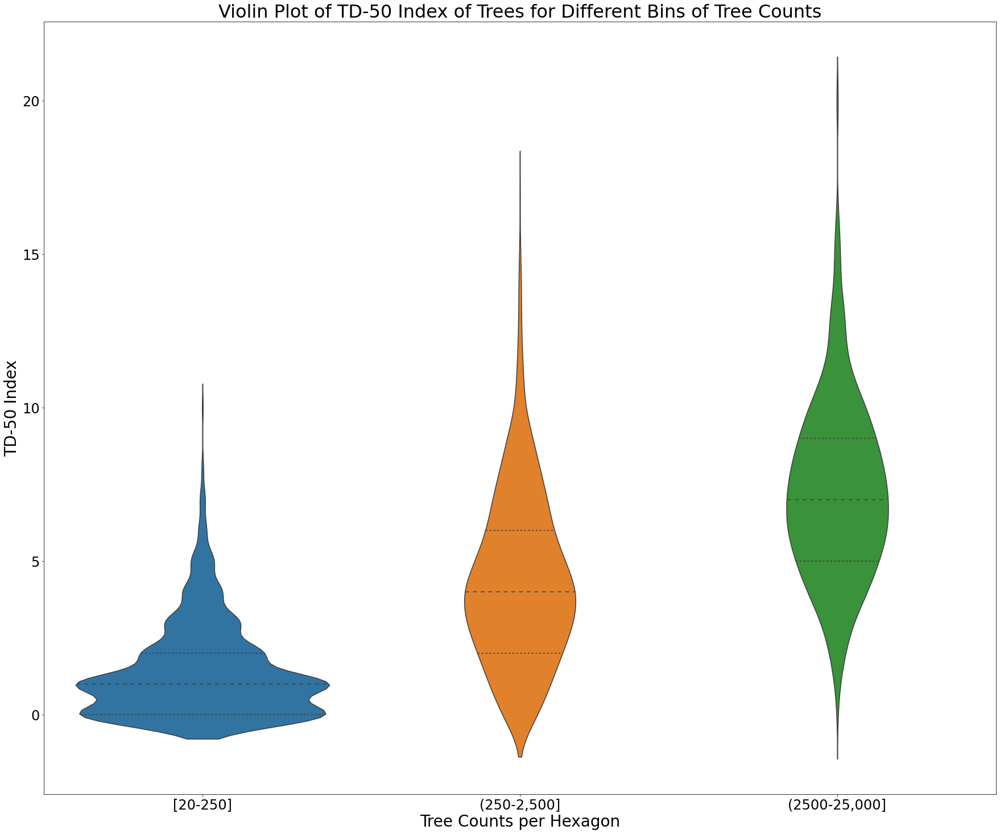

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=df_diversity["TreeBin"], y=df_diversity["LoveTrees"], order=["[20-250]", "(250-2,500]", "(2500-25,000]"], inner="quartile")
ax.set_ylabel("TD-50 Index", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Tree Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of TD-50 Index of Trees for Different Bins of Tree Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

## Birds

In [ ]:
%%bigquery --project urban-forest-269703 df_birds
SELECT 
  grid, SUM(individualCount) as count
FROM `urban-forest-269703.ebird.ebird-final`
GROUP BY grid
HAVING sum(individualCount) >= 80 AND grid IS NOT NULL

In [ ]:
df_birds["log"] = np.log(df_birds["count"])

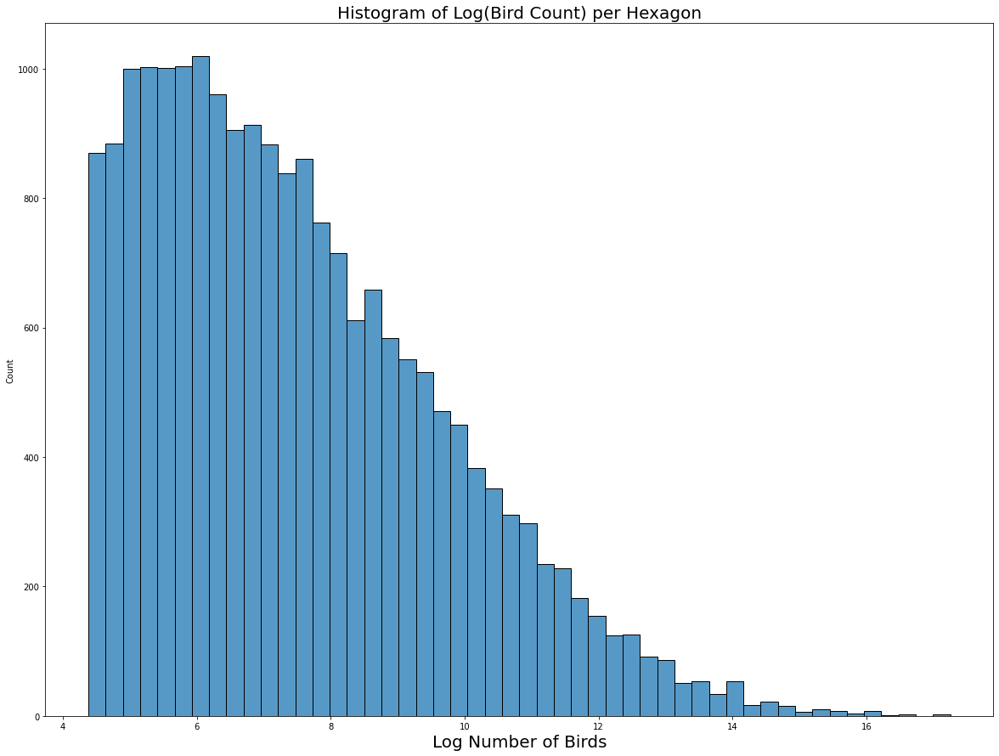

In [ ]:
fig, ax = plt.subplots(figsize=(20,15))
sns.histplot(df_birds, x="log", bins=50)
ax.set_xlabel("Log Number of Birds", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Histogram of Log(Bird Count) per Hexagon", fontdict={"fontsize":20, "fontweight":"medium"})
fig.show()

In [ ]:
hist = np.histogram(df_birds["log"], bins=50)
print(hist[0].sum() // 3)
## (0 - 6.18399593, 6779) | (6.18399593 - 8.24338941, 6836) | (8.24338941 - 18, 6715)
hist

6776


(array([ 870,  884,  999, 1002, 1001, 1004, 1019,  960,  905,  913,  883,
         838,  860,  762,  715,  611,  659,  584,  551,  531,  471,  450,
         383,  351,  311,  297,  235,  228,  182,  154,  125,  126,   92,
          86,   51,   54,   34,   53,   17,   22,   16,    6,   10,    8,
           4,    8,    1,    2,    0,    2]),
 array([ 4.38202663,  4.63945082,  4.89687501,  5.15429919,  5.41172338,
         5.66914756,  5.92657175,  6.18399593,  6.44142012,  6.6988443 ,
         6.95626849,  7.21369267,  7.47111686,  7.72854104,  7.98596523,
         8.24338941,  8.5008136 ,  8.75823778,  9.01566197,  9.27308615,
         9.53051034,  9.78793452, 10.04535871, 10.30278289, 10.56020708,
        10.81763127, 11.07505545, 11.33247964, 11.58990382, 11.84732801,
        12.10475219, 12.36217638, 12.61960056, 12.87702475, 13.13444893,
        13.39187312, 13.6492973 , 13.90672149, 14.16414567, 14.42156986,
        14.67899404, 14.93641823, 15.19384241, 15.4512666 , 15.70869078,
 

In [ ]:
df_birds["bin"] = "[80 - 485)"
df_birds["bin"].loc[df_birds["log"] > 6.18399593] = "[485 - 3,803)"
df_birds["bin"].loc[df_birds["log"] > 8.24338941] = "[3803 - 31million]"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


### Shannon-Weiner Box Plots

In [ ]:
# Run df_birds code at top of section
%%bigquery --project urban-forest-269703 df_birds_species
SELECT grid, verbatimScientificName AS species, sum(individualCount) AS speciesCount
FROM `urban-forest-269703.ebird.ebird-final`
GROUP BY grid, verbatimScientificName

In [ ]:
shannon_index = df_birds.merge(df_birds_species, how='left', left_on='grid', right_on='grid')
shannon_index['p_i'] = shannon_index['speciesCount'] / shannon_index['count']
shannon_index['ln(p_i)'] = np.log(shannon_index['p_i'])
shannon_index['entropy'] = shannon_index['ln(p_i)'] * shannon_index['p_i']
shannon_index = shannon_index.groupby('grid').sum('entropy').reset_index()
shannon_index['Shannon-Wiener'] = -shannon_index['entropy']
shannon_index = shannon_index[["grid", "count", "Shannon-Wiener"]]
shannon_index

,grid,count,Shannon-Wiener
0,0,1057572,2.156587
1,2,56980,3.090369
2,3,502425,3.326592
3,4,1962090,3.797207
4,7,314460,2.453083
...,...,...,...
20325,46793,3969757,3.130180
20326,46795,316512,2.961572
20327,46796,19316,2.658382
20328,46797,208398,3.251794


In [ ]:
shannon_index["BirdLog"] = np.log(shannon_index["count"])
shannon_index["BirdBin"] = "[80 - 485)"
shannon_index["BirdBin"].loc[shannon_index["BirdLog"] > 6.18399593] = "[485 - 3,803)"
shannon_index["BirdBin"].loc[shannon_index["BirdLog"] > 8.24338941] = "[3803 - 31million]"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


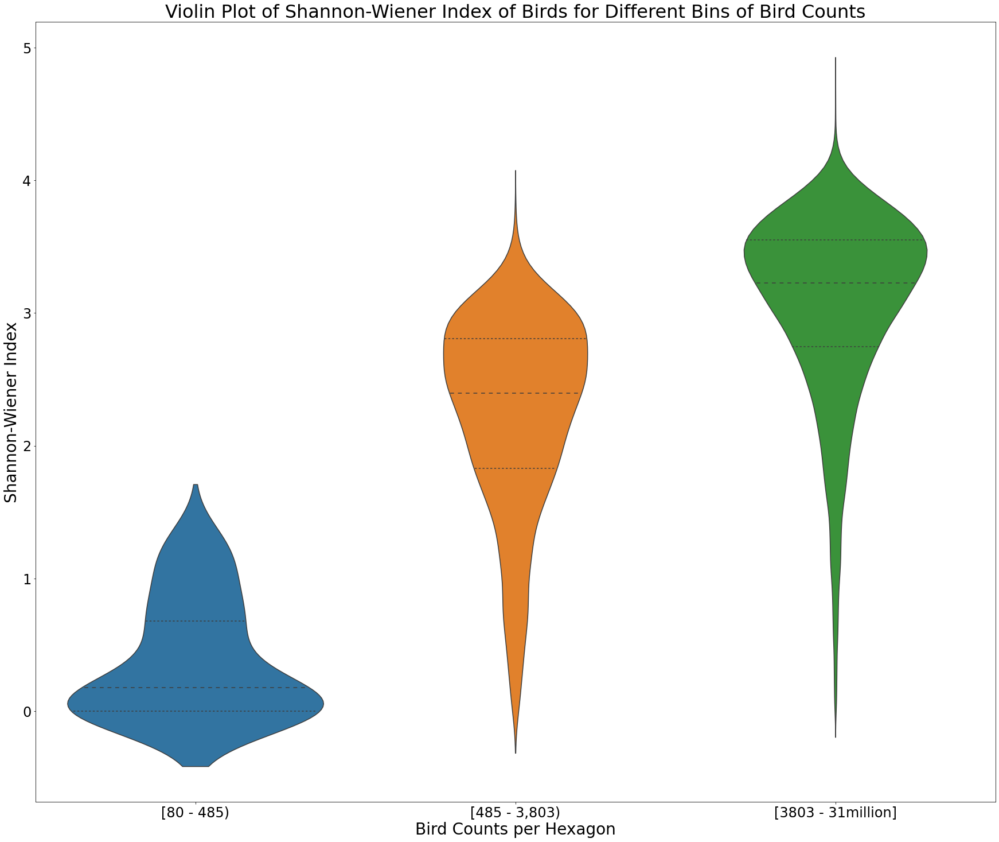

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=shannon_index["BirdBin"], y=shannon_index["Shannon-Wiener"], order=["[80 - 485)", "[485 - 3,803)", "[3803 - 31million]"], inner="quartile")
ax.set_ylabel("Shannon-Wiener Index", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Bird Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of Shannon-Wiener Index of Birds for Different Bins of Bird Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

### Evenness Box Plots

In [ ]:
# Run the first TWO Shannon-Wienner Code blocks (Builds off of it)
species_counts = df_birds_species.groupby('grid').agg(count=pd.NamedAgg(column='species', aggfunc='nunique')).reset_index()
species_counts.columns = ["grid", "speciesCount"]
evenness_index = shannon_index.merge(species_counts, how='left') 
evenness_index['Shannon-Wiener_max'] = np.log(evenness_index['speciesCount'])
evenness_index['EvenBirds'] = evenness_index['Shannon-Wiener'] / evenness_index['Shannon-Wiener_max']
evenness_index = evenness_index[["grid", "count", "EvenBirds"]]
evenness_index

,grid,count,EvenBirds
0,0,1057572,0.482900
1,2,56980,0.771178
2,3,502425,0.714787
3,4,1962090,0.781348
4,7,314460,0.545153
...,...,...,...
20325,46793,3969757,0.611603
20326,46795,316512,0.648849
20327,46796,19316,0.702497
20328,46797,208398,0.715735


In [ ]:
evenness_index["BirdLog"] = np.log(evenness_index["count"])
evenness_index["BirdBin"] = "[80 - 485)"
evenness_index["BirdBin"].loc[evenness_index["BirdLog"] > 6.18399593] = "[485 - 3,803)"
evenness_index["BirdBin"].loc[evenness_index["BirdLog"] > 8.24338941] = "[3803 - 31million]"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


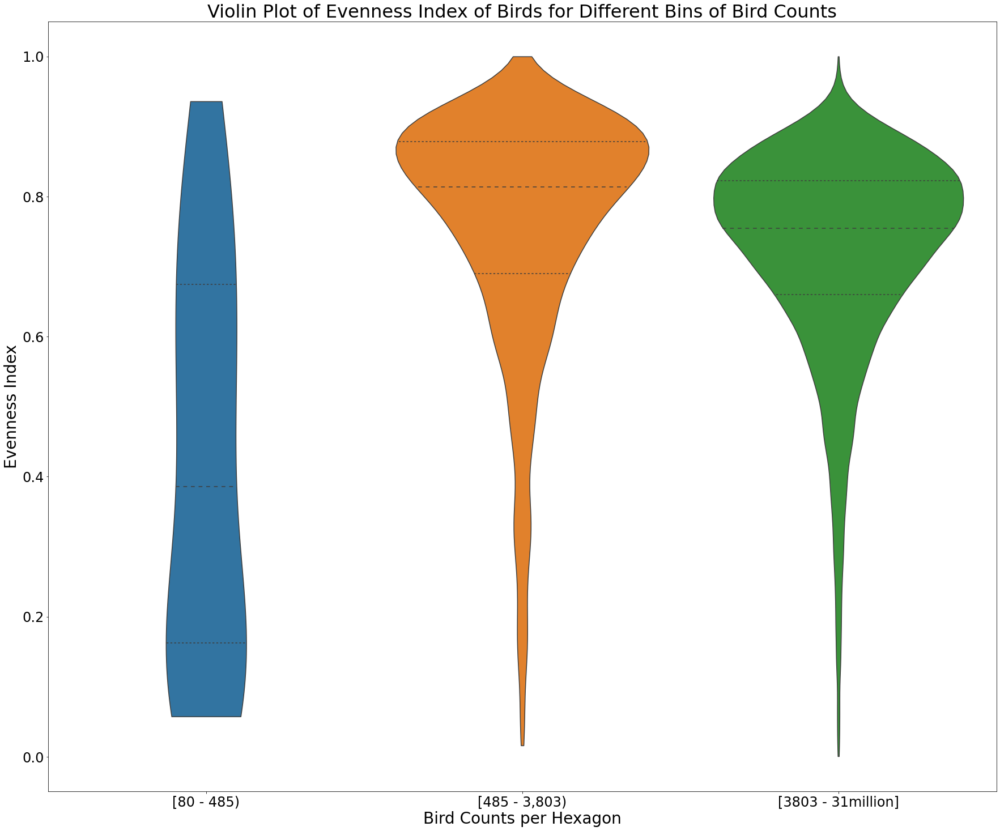

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=evenness_index["BirdBin"], y=evenness_index["EvenBirds"], order=["[80 - 485)", "[485 - 3,803)", "[3803 - 31million]"], inner="quartile", cut=0)
ax.set_ylabel("Evenness Index", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Bird Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of Evenness Index of Birds for Different Bins of Bird Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

### Love Box Plots

In [ ]:
def love_index(df):
  df.reset_index(inplace=True)
  df = df.sort_values('speciesCount', ascending=False)
  midpoint = df['count'][0] / 2 
  love_index = np.sum(df['speciesCount'].cumsum() <= midpoint)
  return love_index

In [ ]:
# Run df_birds code at top of section
%%bigquery --project urban-forest-269703 df_birds_species
SELECT grid, verbatimScientificName AS species, sum(individualCount) AS speciesCount
FROM `urban-forest-269703.ebird.ebird-final`
GROUP BY grid, verbatimScientificName

In [ ]:
love_birds = df_birds.merge(df_birds_species, on='grid')
love_birds = love_birds.groupby(['grid', 'count']).agg(love_index).reset_index()
love_birds.columns = ['grid', 'count', 'LoveBirds']
love_birds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Dropping invalid columns in DataFrameGroupBy.agg is deprecated. In a future version, a TypeError will be raised. Before calling .agg, select only columns which should be valid for the aggregating function.
  


,grid,count,LoveBirds
0,0,12156,0
1,2,1036,4
2,3,4785,6
3,4,15210,10
4,7,3494,1
...,...,...,...
20325,46793,23771,4
20326,46795,3297,3
20327,46796,439,3
20328,46797,2217,5


In [ ]:
love_birds["BirdLog"] = np.log(love_birds["count"])
love_birds["BirdBin"] = "[80 - 485)"
love_birds["BirdBin"].loc[love_birds["BirdLog"] > 6.18399593] = "[485 - 3,803)"
love_birds["BirdBin"].loc[love_birds["BirdLog"] > 8.24338941] = "[3803 - 31million]"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


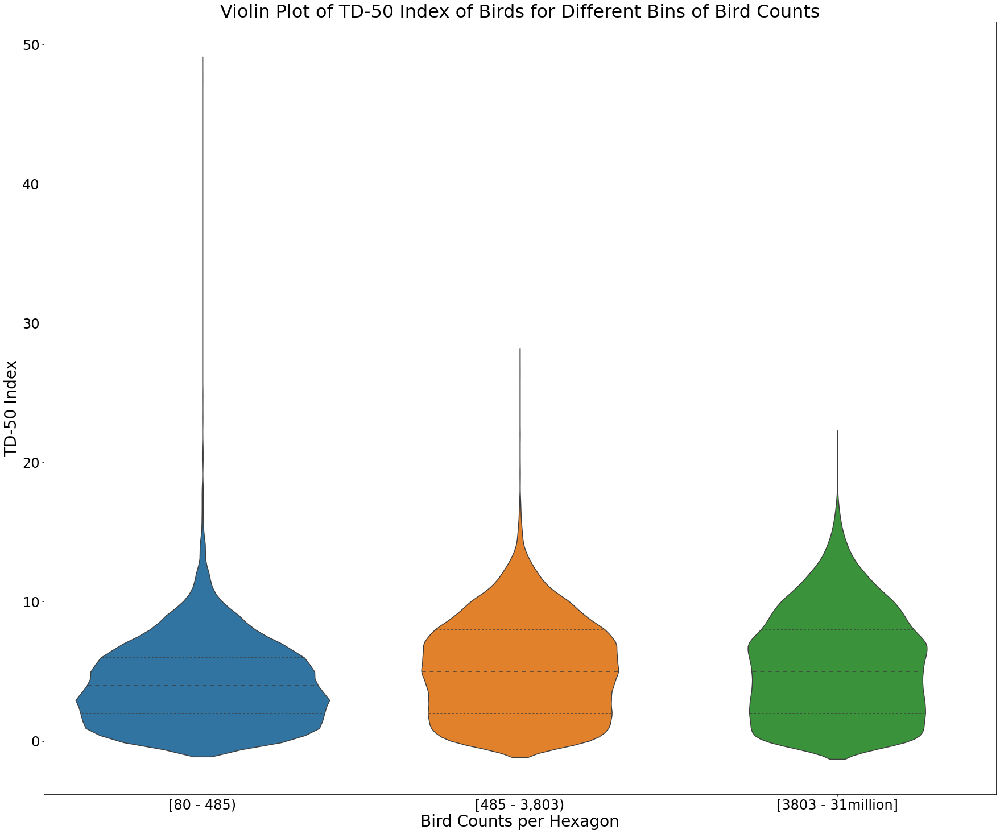

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=love_birds["BirdBin"], y=love_birds["LoveBirds"], order=["[80 - 485)", "[485 - 3,803)", "[3803 - 31million]"], inner="quartile")
ax.set_ylabel("TD-50 Index", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Bird Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of TD-50 Index of Birds for Different Bins of Bird Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

## Populations

In [ ]:
%%bigquery --project urban-forest-269703 df_population
SELECT * FROM `urban-forest-269703.pop_grid.ca-pop-grid`

In [ ]:
df_population = df_population[df_population["Population"] > 0]
df_population["log"] = np.log(df_population["Population"])

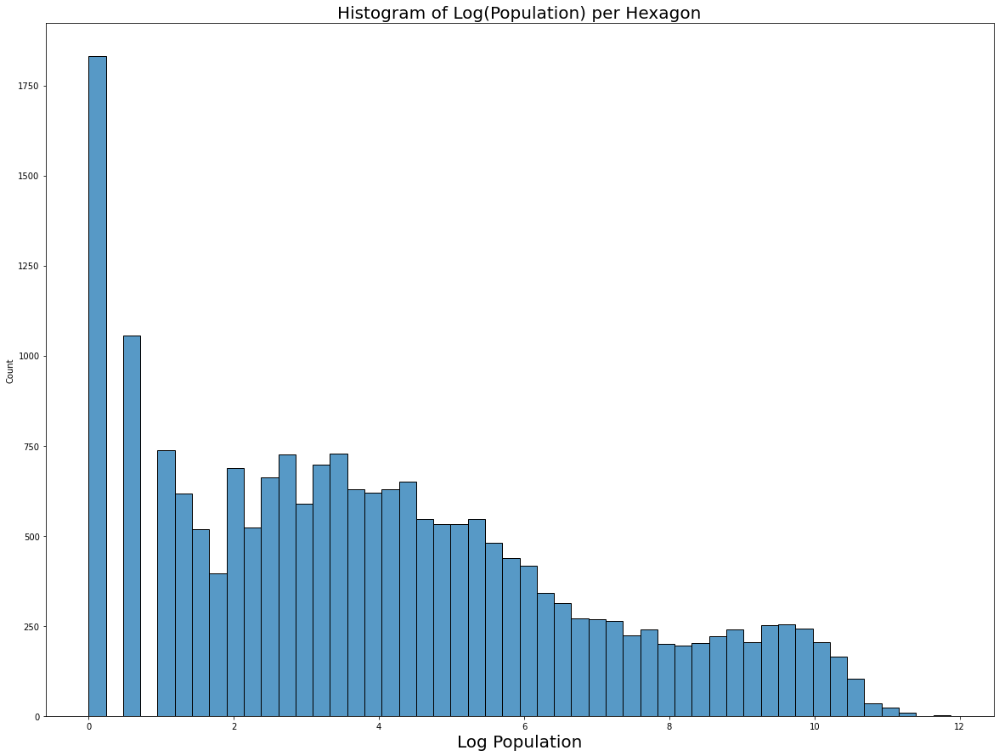

In [ ]:
fig, ax = plt.subplots(figsize=(20,15))
sns.histplot(df_population, x="log", bins=50)
ax.set_xlabel("Log Population", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Histogram of Log(Population) per Hexagon", fontdict={"fontsize":20, "fontweight":"medium"})
fig.show()

In [ ]:
hist = np.histogram(df_population["log"], bins=50)
print(hist[0].sum())
# (0 - 2.61237498, 7028) | (2.61237498 - 5.22474996, 6880) | (5.22474996 - 12, 6356)
hist

20264


(array([1831,    0, 1055,    0,  737,  618,  519,  396,  687,  522,  663,
         725,  588,  697,  729,  628,  620,  630,  651,  547,  533,  532,
         547,  481,  438,  416,  342,  312,  271,  268,  264,  224,  240,
         201,  195,  202,  222,  240,  204,  251,  255,  242,  204,  164,
         103,   36,   24,    8,    0,    2]),
 array([ 0.        ,  0.23748863,  0.47497727,  0.7124659 ,  0.94995454,
         1.18744317,  1.42493181,  1.66242044,  1.89990908,  2.13739771,
         2.37488634,  2.61237498,  2.84986361,  3.08735225,  3.32484088,
         3.56232952,  3.79981815,  4.03730678,  4.27479542,  4.51228405,
         4.74977269,  4.98726132,  5.22474996,  5.46223859,  5.69972723,
         5.93721586,  6.17470449,  6.41219313,  6.64968176,  6.8871704 ,
         7.12465903,  7.36214767,  7.5996363 ,  7.83712493,  8.07461357,
         8.3121022 ,  8.54959084,  8.78707947,  9.02456811,  9.26205674,
         9.49954538,  9.73703401,  9.97452264, 10.21201128, 10.44949991,
 

### Box Plots

In [ ]:
%%bigquery --project urban-forest-269703 df_diversity
SELECT * FROM `urban-forest-269703.treebirdagg.10-km-stats-main`

In [ ]:
df_diversity = df_diversity[df_diversity["Population"] > 0]
df_diversity["PopLog"] = np.log(df_diversity["Population"])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_diversity["PopBin"] = "(0-14)"
df_diversity["PopBin"].loc[df_diversity["PopLog"] > 2.61237498] = "[14-186)"
df_diversity["PopBin"].loc[df_diversity["PopLog"] > 5.22474996] = "[186 - 143,549]"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


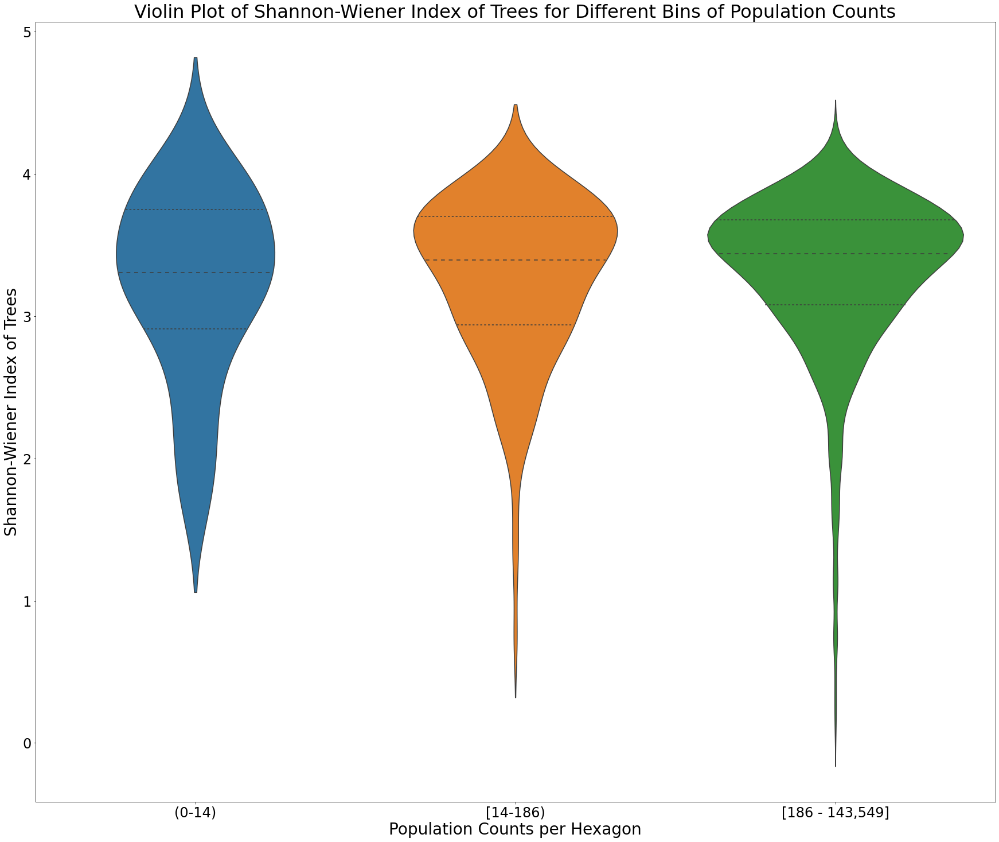

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=df_diversity["PopBin"], y=df_diversity["ShannonTree"], order=["(0-14)", "[14-186)", "[186 - 143,549]"], inner="quartile")
ax.set_ylabel("Shannon-Wiener Index of Trees", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Population Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of Shannon-Wiener Index of Trees for Different Bins of Population Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

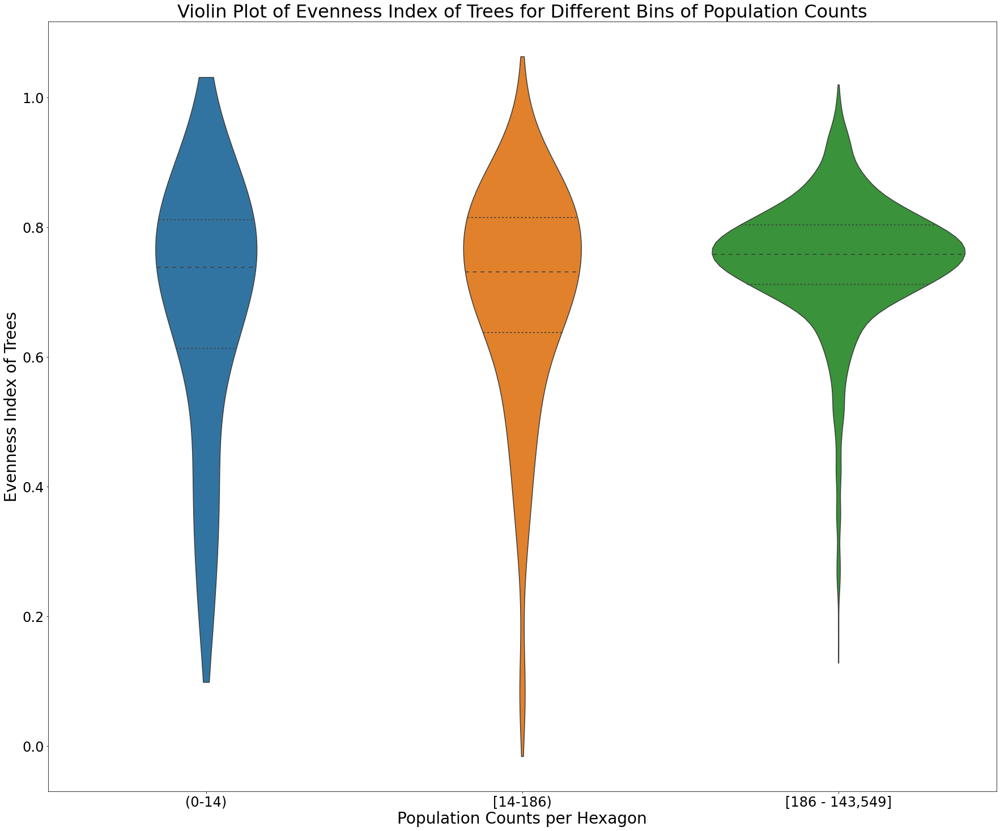

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=df_diversity["PopBin"], y=df_diversity["EvenTrees"], order=["(0-14)", "[14-186)", "[186 - 143,549]"], inner="quartile", cut=True)
ax.set_ylabel("Evenness Index of Trees", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Population Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Violin Plot of Evenness Index of Trees for Different Bins of Population Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

0.943557626867577

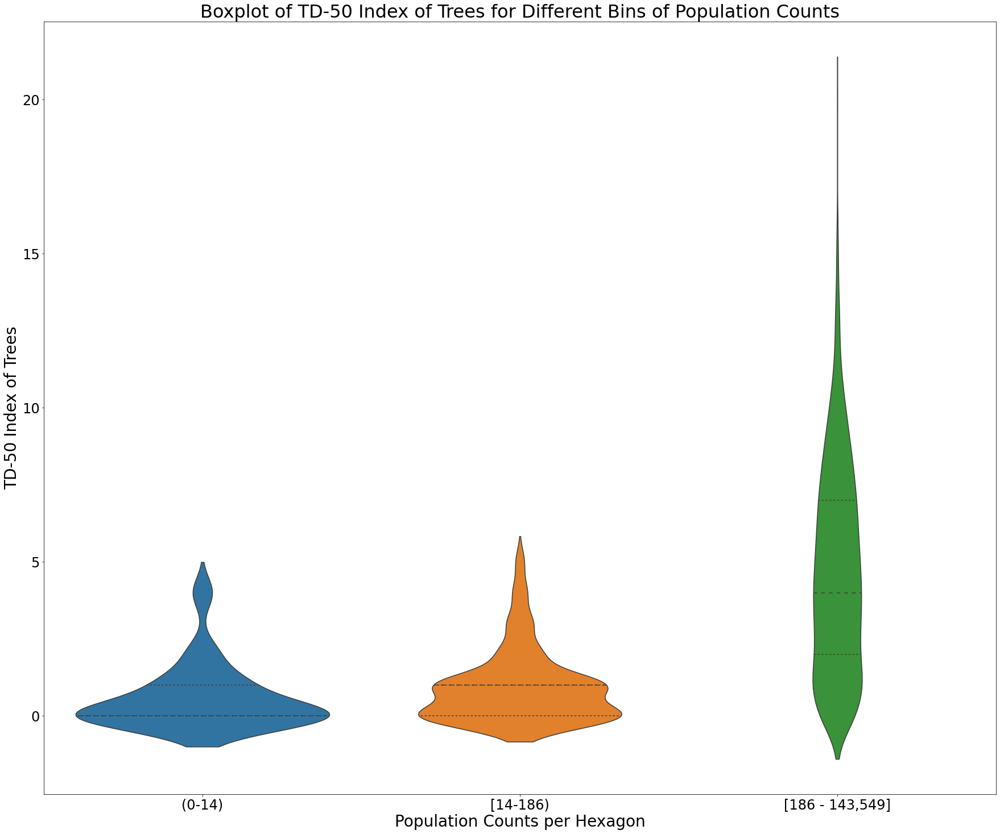

In [ ]:
fig, ax = plt.subplots(figsize=(30,25))
sns.violinplot(x=df_diversity["PopBin"], y=df_diversity["LoveTrees"], order=["(0-14)", "[14-186)", "[186 - 143,549]"], inner="quartile")
ax.set_ylabel("TD-50 Index of Trees", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_xlabel("Population Counts per Hexagon", fontdict={"fontsize":28, "fontweight":"medium"})
ax.set_title("Boxplot of TD-50 Index of Trees for Different Bins of Population Counts", fontdict={"fontsize":32, "fontweight":"medium"})
plt.xticks(size=24)
plt.yticks(size=24)
fig.show()

# Bird Distributions

## Loading the Data into DataFrames

In [ ]:
!echo deb http://packages.cloud.google.com/apt gcsfuse-bionic main > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | apt-key add -
!apt -qq update
!apt -qq install gcsfuse
!mkdir colab_directory
!gcsfuse --implicit-dirs urbanforest colab_directory

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  2537  100  2537    0     0  87482      0 --:--:-- --:--:-- --:--:-- 87482
OK
60 packages can be upgraded. Run 'apt list --upgradable' to see them.
The following NEW packages will be installed:
  gcsfuse
0 upgraded, 1 newly installed, 0 to remove and 60 not upgraded.
Need to get 12.0 MB of archives.
After this operation, 28.6 MB of additional disk space will be used.
Selecting previously unselected package gcsfuse.
(Reading database ... 156210 files and directories currently installed.)
Preparing to unpack .../gcsfuse_0.40.0_amd64.deb ...
Unpacking gcsfuse (0.40.0) ...
Setting up gcsfuse (0.40.0) ...
2022/03/28 21:18:24.960077 Start gcsfuse/0.40.0 (Go version go1.17.6) for app "" using mount point: /content/colab_directory
2022/03/28 21:18:24.974794 Opening GCS connection...
2022/03/28 21:18:25.246208 Mounting file system "urb

In [ ]:
gpd_birds = gpd.read_file("colab_directory/bird_distributions/BOTW.gdb", driver="FileGDB", laye)

# Adding Birds with Null Grids to Grids

In [ ]:
%%bigquery --project urban-forest-269703 df_birds
SELECT 
   DISTINCT decimalLatitude AS Latitude, decimalLongitude AS Longitude 
FROM `urban-forest-269703.ebird.ebird-final`
  WHERE grid IS NULL 

In [ ]:
gdf_birds = gpd.GeoDataFrame(df_birds, geometry = gpd.GeoSeries.from_xy(df_birds.Longitude, df_birds.Latitude), crs="EPSG:4326")

In [ ]:
cd drive/MyDrive/'Cal Fire Urban Forestry Bird Diversity Project'/'CA Grids'/

/content/drive/.shortcut-targets-by-id/19j9YdaLhu7ixHd8XS0vmx4u8aFAHNFJ4/Cal Fire Urban Forestry Tree Bird Biodiversity Project/CA Grids


In [ ]:
from fiona.crs import from_epsg
states_gdf = gpd.read_file("cb_2018_us_state_500k.shp")
ca_state = states_gdf[states_gdf['NAME']=='California']

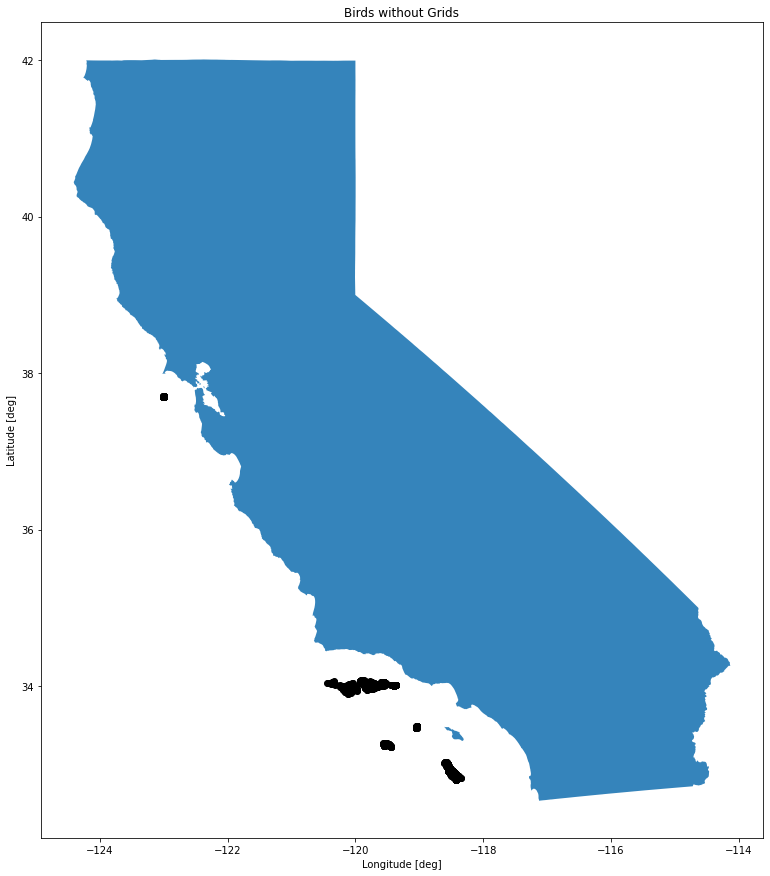

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
ca_state.plot(ax=ax, color='tab:blue', alpha=0.9)
gdf_birds.plot(ax=ax, color="black")
ax.set_title("Birds without Grids")
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
fig.show()

In [ ]:
%%bigquery --project urban-forest-269703 df_grid
SELECT ID, geometry FROM `urban-forest-269703.grid.ca-grid-hexagons`

In [ ]:
gdf_grid = gpd.GeoDataFrame(df_grid, geometry=gpd.GeoSeries.from_wkt(df_grid.geometry), crs="EPSG:4326")

In [ ]:
combined = gdf_birds.sjoin_nearest(gdf_grid, how="left", max_distance=.1)

closest = pd.merge(gdf_grid, combined, how="inner", left_on="ID", right_on="ID")

gdf_closest = gpd.GeoDataFrame(closest, geometry=closest.geometry_x, crs="EPSG:4326")

/usr/local/lib/python3.7/dist-packages/geopandas/array.py:348: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  stacklevel=stacklevel,


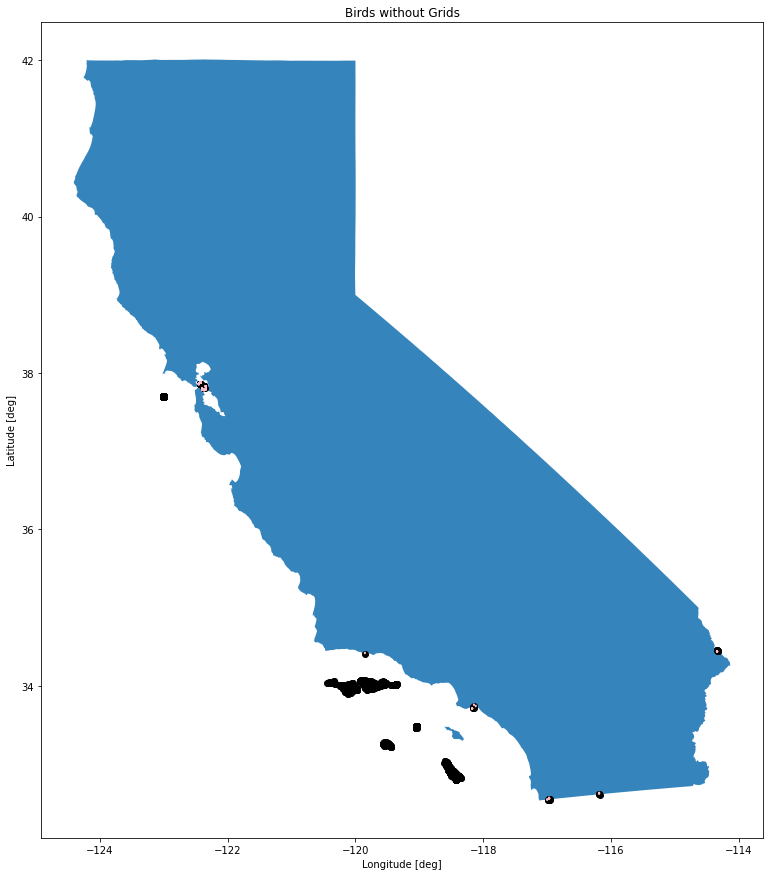

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
ca_state.plot(ax=ax, color='tab:blue', alpha=0.9)
gdf_birds.plot(ax=ax, color="black")
gdf_closest.plot(ax=ax, color="pink")
ax.set_title("Birds without Grids")
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
fig.show()

In [ ]:
assigned_grids = closest[["ID", "Latitude", "Longitude"]]

# Looking at Smaller Grids

## Creating the Grids

In [ ]:
cd drive/MyDrive/'Cal Fire Urban Forestry Bird Diversity Project'/'CA Grids'/

/content/drive/.shortcut-targets-by-id/19j9YdaLhu7ixHd8XS0vmx4u8aFAHNFJ4/Cal Fire Urban Forestry Tree Bird Biodiversity Project/CA Grids


In [ ]:
from fiona.crs import from_epsg
states_gdf = gpd.read_file("cb_2018_us_state_500k.shp")
ca_state = states_gdf[states_gdf['NAME']=='California']

regions = states_gdf[states_gdf['NAME'] == 'California'].geometry.explode().tolist()


def geom_to_gdf(g, label):
    gdf = gpd.GeoDataFrame()
    gdf.crs = from_epsg(4326)
    gdf.loc[0, 'geometry'] = g
    gdf.loc[0, 'Location'] = label
    return gdf
    
max_region = max(regions, key=lambda a: a.area)
santa_catalina = regions[0]
sc_gdf = geom_to_gdf(santa_catalina, 'Santa Catalina Island')
ca_gdf = geom_to_gdf(max_region, 'Mainland California')
ca_gdf = ca_gdf.append(sc_gdf)
ca_gdf

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureW

,geometry,Location
0,"POLYGON ((-124.40860 40.44320, -124.39664 40.4...",Mainland California
0,"POLYGON ((-118.60442 33.47855, -118.59878 33.4...",Santa Catalina Island


In [ ]:
def create_hex_centers(x_min, y_min, x_max, y_max, side):
    """
    returns an array of Points describing hexagons centers that are inside the given bounding_box
    :param bbox: The containing bounding box. The bbox coordinate should be in Webmercator.
    :param side: The size of the hexagons'
    :return: The hexagon grid
    """
    grid = []

    v_step = math.sqrt(3) * side
    h_step = 1.5 * side

    h_skip = math.ceil(x_min / h_step) - 1
    h_start = h_skip * h_step

    v_skip = math.ceil(y_min / v_step) - 1
    v_start = v_skip * v_step

    h_end = x_max + h_step
    v_end = y_max + v_step

    if v_start - (v_step / 2.0) < y_min:
        v_start_array = [v_start + (v_step / 2.0), v_start]
    else:
        v_start_array = [v_start - (v_step / 2.0), v_start]

    v_start_idx = int(abs(h_skip) % 2)

    c_x = h_start
    c_y = v_start_array[v_start_idx]
    v_start_idx = (v_start_idx + 1) % 2
    while c_x < h_end:
        while c_y < v_end:
            grid.append((c_x, c_y))
            c_y += v_step
        c_x += h_step
        c_y = v_start_array[v_start_idx]
        v_start_idx = (v_start_idx + 1) % 2

    return grid

In [ ]:
def create_hexagon(l, x, y):
    """
    Create a hexagon centered on (x, y)
    :param l: length of the hexagon's edge
    :param x: x-coordinate of the hexagon's center
    :param y: y-coordinate of the hexagon's center
    :return: The polygon containing the hexagon's coordinates
    """
    c = [[x + math.cos(math.radians(angle)) * l, y + math.sin(math.radians(angle)) * l] for angle in range(0, 360, 60)]
    return Polygon(c)

def create_hexgrid(size):
  xmin, ymin, xmax, ymax = ca_state.total_bounds
  hexagon_centers = create_hex_centers(xmin, ymin, xmax, ymax, size)
  grid_cells = []
  for center in hexagon_centers:
          new_cell = create_hexagon(size, center[0], center[1])
          if new_cell.intersects(ca_gdf.iloc[0,0]) or new_cell.intersects(ca_gdf.iloc[1,0]):
              grid_cells.append(new_cell)
          else:
              pass

  hexagon = gpd.GeoDataFrame(geometry=grid_cells)
  return hexagon

In [ ]:
# Creates an Area with size of 10km2
grid = create_hexgrid(.01865098124)
grid = grid.reset_index()
print(len(grid))

46800


In [ ]:
math.sqrt(gdf_grid.loc[1]["geometry"].area)
#math.sqrt(10 * (2/(3 * math.sqrt(3))))

0.12088911733014826

In [ ]:
math.sqrt(10 * (2/(3 * math.sqrt(3))))

1.9618873042551412

In [ ]:
# Val that gives 42397 Hexagons
val = .019601999
grid = create_hexgrid(val)
print(len(grid), val)

42397 0.019601999


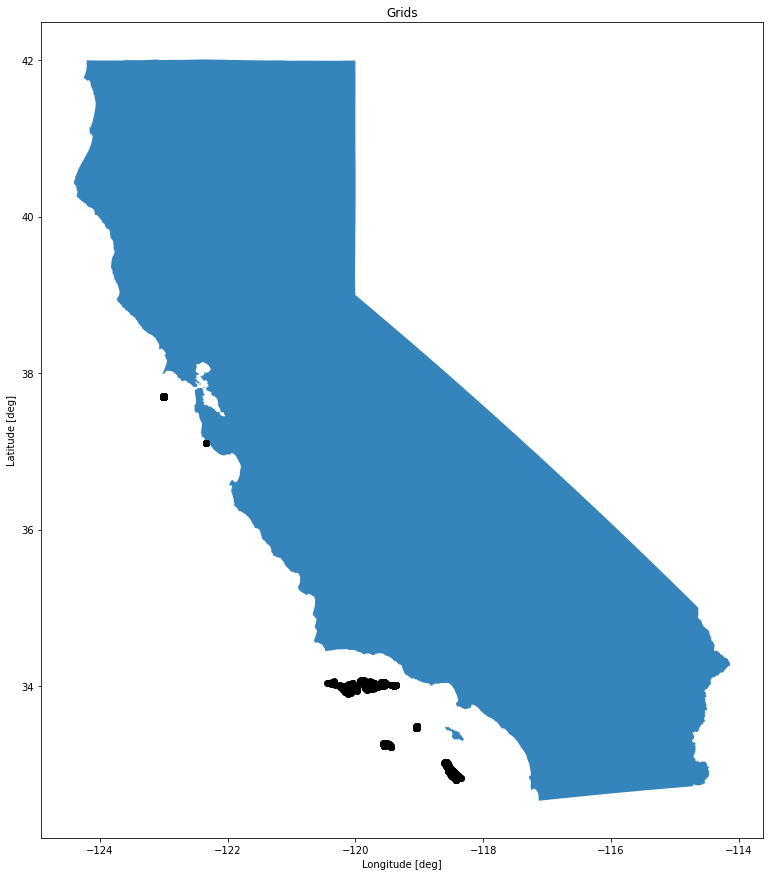

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
ca_state.plot(ax=ax, color='tab:blue', alpha=0.9)
test.plot(ax=ax, color='k')
ax.set_title('Grids')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
fig.show()

## Looking at the Grid

In [ ]:
gdf_grid = gpd.GeoDataFrame(grid, geometry=grid.geometry, crs='EPSG:4326')
gdf_trees = gpd.GeoDataFrame(df_trees, geometry=gpd.GeoSeries.from_xy(df_trees.longitude, df_trees.latitude), crs='EPSG:4326')
gdf_birds = gpd.GeoDataFrame(df_birds, geometry=gpd.GeoSeries.from_xy(df_birds.Longitude, df_birds.Latitude), crs="EPSG:4326")

In [ ]:
combined_trees = gdf_trees.sjoin(gdf_grid, how='left', predicate='within')
combined_birds = gdf_birds.sjoin(gdf_grid, how='left', predicate='within')

In [ ]:
combined_trees = combined_trees[["longitude", "latitude", "count", "index"]]
combined_trees.columns = ["longitude", "latitude", "count", "grid"]
combined_trees["grid"] = combined_trees["grid"].astype('Int64')
total_trees = combined_trees.groupby("grid").sum("count").reset_index()

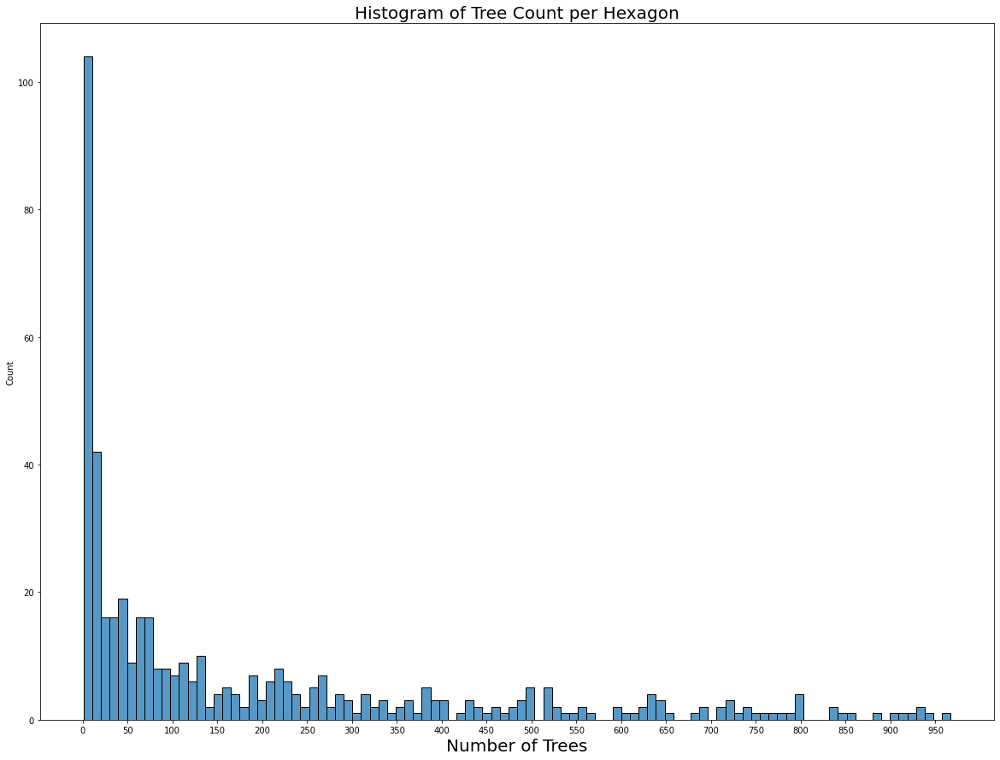

In [ ]:
only_trees = total_trees[(total_trees["count"] != 0) & (total_trees["count"] < 1000)]
fig, ax = plt.subplots(figsize=(20,15))
sns.histplot(only_trees, x="count", bins=100)
ax.set_xlabel("Number of Trees", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Histogram of Tree Count per Hexagon", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_xticks(np.arange(0,1000,50))
fig.show()

In [ ]:
combined_birds = combined_birds[["Longitude", "Latitude", "Count", "index"]]
combined_birds.columns = ["longitude", "latitude", "count", "grid"]
combined_birds["grid"] = combined_birds["grid"].astype('Int64')
total_birds = combined_birds.groupby("grid").sum("count").reset_index()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


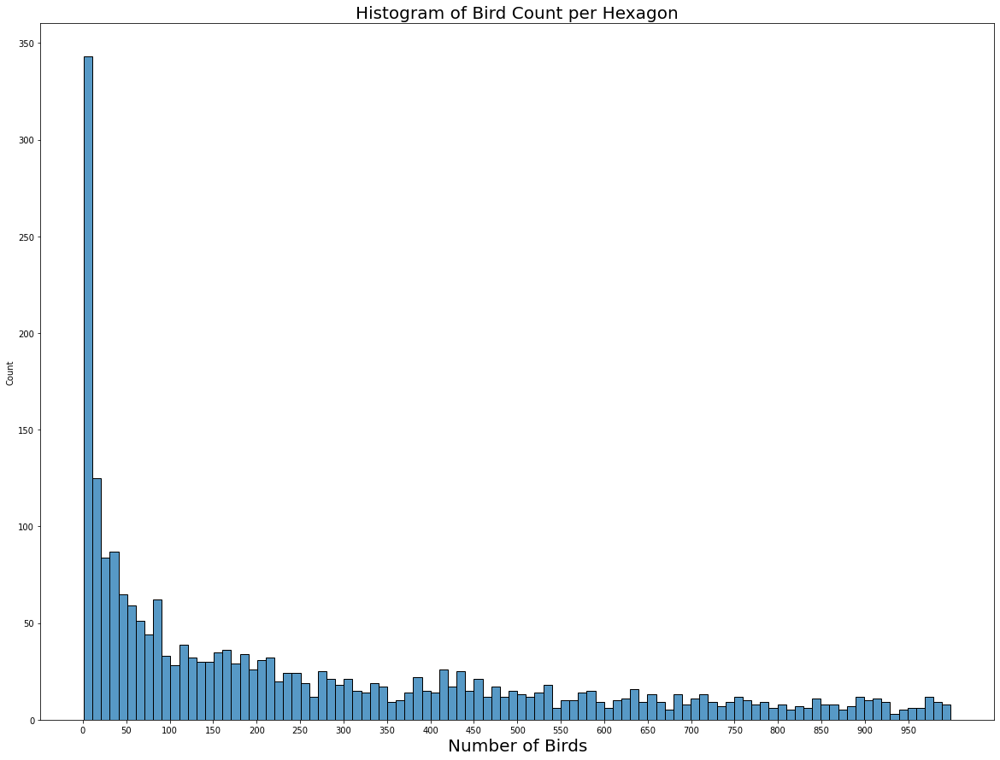

In [ ]:
only_birds = total_birds[(total_birds["count"] != 0) & (total_birds["count"] < 1000)]
fig, ax = plt.subplots(figsize=(20,15))
sns.histplot(only_birds, x="count", bins=100)
ax.set_xlabel("Number of Birds", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Histogram of Bird Count per Hexagon", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_xticks(np.arange(0,1000,50))
fig.show()

In [ ]:
print("Percent of Bird Hexagons < 10 :",(only_birds["count"] < 10).sum() / len(only_birds))
print("Percent of Tree Hexagons < 10 : ",(only_trees["count"] < 10).sum() / len(only_trees))

Percent of Bird Hexagons < 10 : 0.1409308394954328
Percent of Tree Hexagons < 10 :  0.21244635193133046


In [ ]:
merged_trees = pd.merge(total_trees, gdf_grid, how="left", right_on="index", left_on="grid")
gdf_trees = gpd.GeoDataFrame(merged_trees, geometry=merged_trees.geometry, crs="EPSG:4326")

In [ ]:
gdf_trees['color'] = 'navy'
gdf_trees['margin'] = (gdf_trees['count'] - gdf_trees['count'].min()) / \
                            (gdf_trees['count'].max() - gdf_trees['count'].min())

gdf_trees['margin2'] = gdf_trees['margin'] * (1 - .1) + .1
from matplotlib.colors import to_rgba
gdf_trees['color_rgba'] = gdf_trees.apply(
    lambda row: to_rgba(row['color'], alpha=row['margin2']), axis=1)

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:645: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  "Only specify one of 'column' or 'color'. Using 'color'.", UserWarning


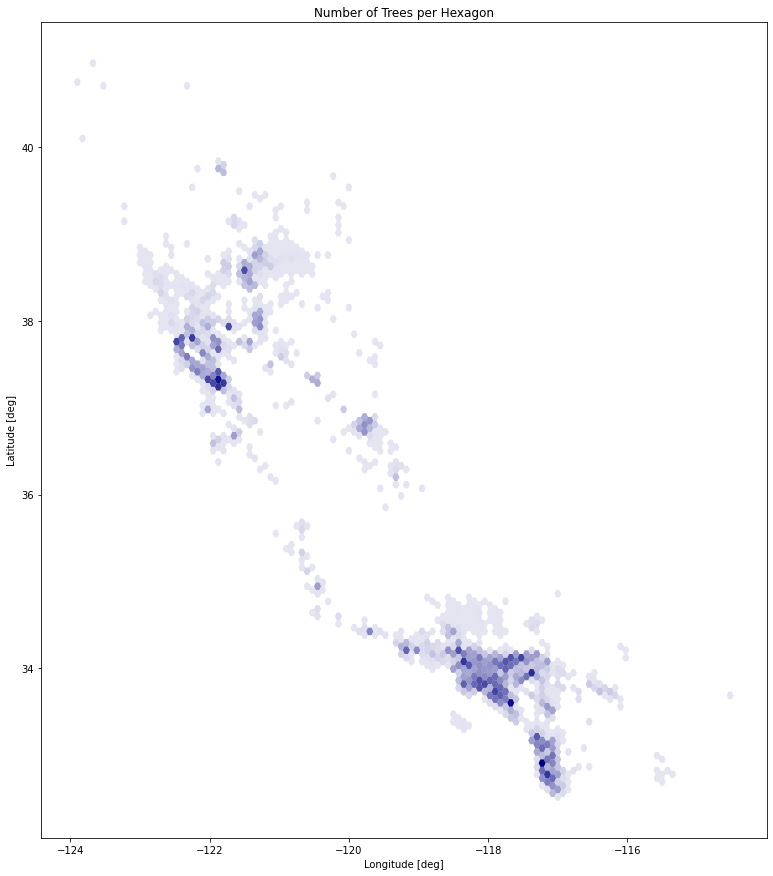

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
gdf_trees.plot(column="count", ax=ax, color=gdf_trees["color_rgba"])
ax.set_title("Number of Trees per Hexagon")
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
fig.show()

In [ ]:
merged_birds = pd.merge(total_birds, gdf_grid, how="left", right_on="index", left_on="grid")
gdf_birds = gpd.GeoDataFrame(merged_birds, geometry=merged_birds.geometry, crs="EPSG:4326")

In [ ]:
gdf_birds['color'] = 'navy'
gdf_birds['margin'] = (gdf_birds['count'] - gdf_birds['count'].min()) / \
                            (gdf_birds['count'].max() - gdf_birds['count'].min())

gdf_birds['margin2'] = gdf_birds['margin'] * (1 - .1) + .1
from matplotlib.colors import to_rgba
gdf_birds['color_rgba'] = gdf_birds.apply(
    lambda row: to_rgba(row['color'], alpha=row['margin2']), axis=1)

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:645: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  "Only specify one of 'column' or 'color'. Using 'color'.", UserWarning


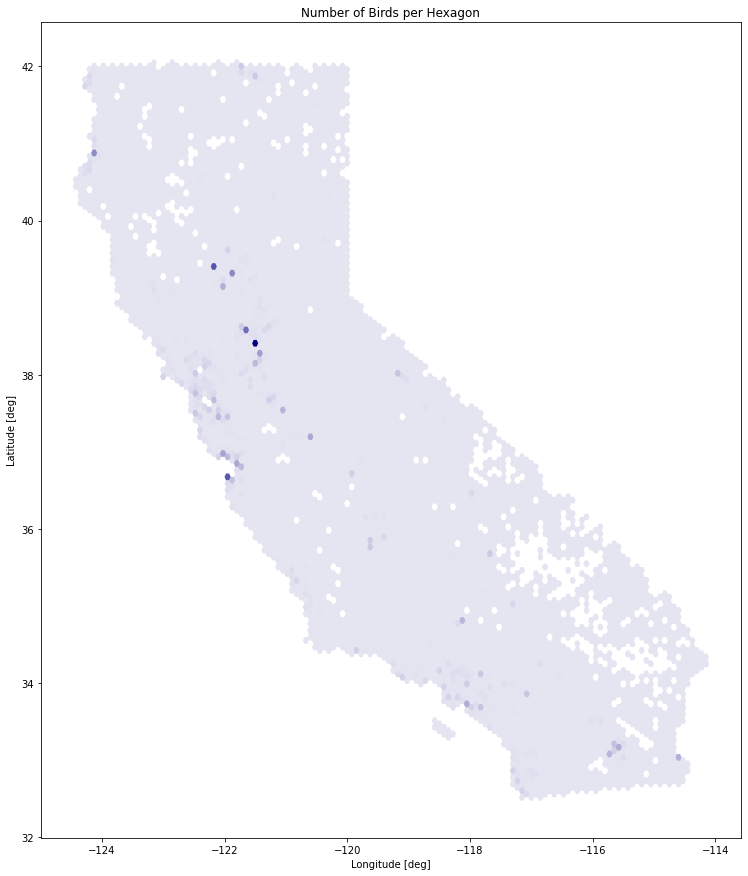

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
#gdf_grid.plot(ax=ax, color="lightgrey")
gdf_birds.plot(column="count", ax=ax, color=gdf_birds["color_rgba"])
ax.set_title("Number of Birds per Hexagon")
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
fig.show()

# Combining Hexagons and Climate/Urban


In [ ]:
%%bigquery --project urban-forest-269703 df_hexagons
SELECT * FROM `urban-forest-269703.grid.ca-grid-hexagons-large`

## Climate Data

In [ ]:
%%bigquery --project urban-forest-269703 df_climate
SELECT * FROM `urban-forest-269703.grid.climate-areas`

In [ ]:
# TO EXPENSIVE, AND INTERSECTION ISN'T WORKING RIGHT
%%bigquery --project urban-forest-269703 climate_combined
SELECT grid.ID AS grid, region
    FROM `urban-forest-269703.grid.ca-grid-hexagons` AS grid
    CROSS JOIN `urban-forest-269703.grid.climate-areas` AS climate
    WHERE ST_AREA(ST_INTERSECTION(grid.geometry, climate.geom)) = 0

In [ ]:
df_climate["geom"] = gpd.GeoSeries.from_wkt(df_climate.geom)
df_hexagons["geometry"] = gpd.GeoSeries.from_wkt(df_hexagons.geometry)

In [ ]:
merged = pd.merge(df_hexagons, df_climate, how="cross")
merged = merged[["id", "geometry", "ID", "region", "geom"]]
merged.columns = ["grid", "gridGeom", "regionID", "region", "climGeom"]
merged["intersect"] = gpd.GeoSeries(merged.gridGeom).intersection(gpd.GeoSeries(merged.climGeom))
reduced = merged[gpd.GeoSeries(merged["intersect"]).is_empty == False]
reduced["area"] = gpd.GeoSeries(reduced["intersect"]).area

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
# Final Combinations
combined = reduced.groupby("grid").max("area").reset_index()
combined = pd.merge(df_hexagons, combined, how="left", left_on="id", right_on="grid")

In [ ]:
# Investigating Combinations
combined = reduced.groupby("grid").count().reset_index()
combined = combined[combined["area"] > 1]
combined = pd.merge(df_hexagons, combined, how="left", left_on="ID", right_on="grid")

In [ ]:
combined.loc[0, "regionID"] = 3
combined.loc[1, "regionID"] = 5

In [ ]:
combined[combined["regionID"].isna()]

,id,geometry,grid,regionID,area


In [ ]:
# Adding the Hexagons not touching data to the closest for SMALLER Hexagons
combined.loc[210, "regionID"] = 4
combined.loc[11987, "regionID"] = 4
combined.loc[13329, "regionID"] = 4
combined.loc[31947, "regionID"] = 5
combined.loc[32074, "regionID"] = 5
combined.loc[32325, "regionID"] = 5
combined.loc[46674, "regionID"] = 6

In [ ]:
# Adding the Hexagons not touching data to the closest for LARGER Hexagons
combined.loc[1574, "regionID"] = 3
combined.loc[2057, "regionID"] = 5

In [ ]:
gdf_grid = gpd.GeoDataFrame(df_hexagons, geometry=df_hexagons.geometry, crs="EPSG:4326")
gdf_climate = gpd.GeoDataFrame(df_climate, geometry=df_climate.geom, crs="EPSG:4326")
gdf_combined = gpd.GeoDataFrame(combined, geometry=combined.geometry, crs="EPSG:4326")

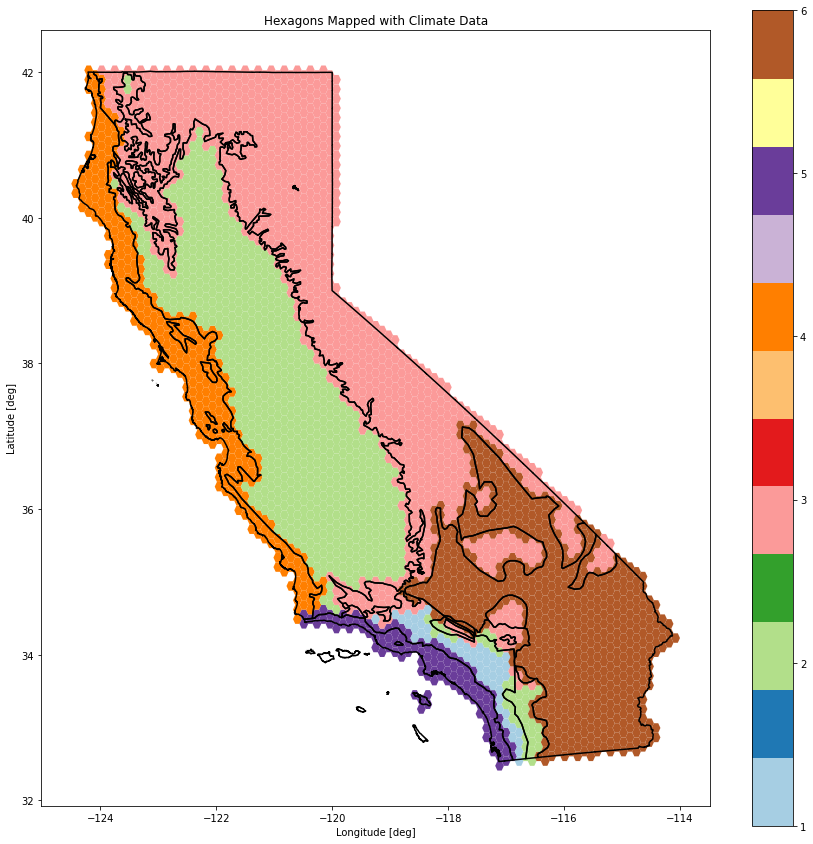

In [ ]:
fig, ax = plt.subplots(figsize=(15,15))
#gdf_grid.plot(ax=ax, color="red")
gdf_combined.plot(ax=ax, cmap="Paired", column="regionID", legend=True)
gdf_climate.boundary.plot(ax=ax, color="black")
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.set_title("Hexagons Mapped with Climate Data")
plt.show()

In [ ]:
combined = combined[["id", "regionID", "geometry"]]
combined.columns = ["ID", "climateID", "geometry"]
combined["climateID"] = combined["climateID"].astype('Int64')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
combined.to_csv("colab_directory/ca-grid-hexagons-large.csv", index=False)
# New ca-grids-...
# ID as int, climateID as int, geometry as geography

Urban Data

In [ ]:
%%bigquery --project urban-forest-269703 df_urban
SELECT * FROM `urban-forest-269703.grid.urban-areas`

In [ ]:
combined

,ID,climateID,geometry
0,0,4,"POLYGON ((-124.39272 40.41286, -124.40204 40.4..."
1,1,4,"POLYGON ((-124.39272 40.44517, -124.40204 40.4..."
2,2,4,"POLYGON ((-124.36474 40.39671, -124.37407 40.4..."
3,3,4,"POLYGON ((-124.36474 40.42902, -124.37407 40.4..."
4,4,4,"POLYGON ((-124.36474 40.46132, -124.37407 40.4..."
...,...,...,...
46795,46795,6,"POLYGON ((-114.15333 34.30732, -114.16266 34.3..."
46796,46796,6,"POLYGON ((-114.15333 34.33963, -114.16266 34.3..."
46797,46797,6,"POLYGON ((-114.12535 34.25887, -114.13468 34.2..."
46798,46798,6,"POLYGON ((-114.12535 34.29117, -114.13468 34.3..."


In [ ]:
gdf_urban = gpd.GeoDataFrame(df_urban, geometry=gpd.GeoSeries.from_wkt(df_urban.geometry), crs="EPSG:4326")
gdf_grid = gpd.GeoDataFrame(df_hexagons, geometry=gpd.GeoSeries.from_wkt(df_hexagons.geometry), crs="EPSG:4326")

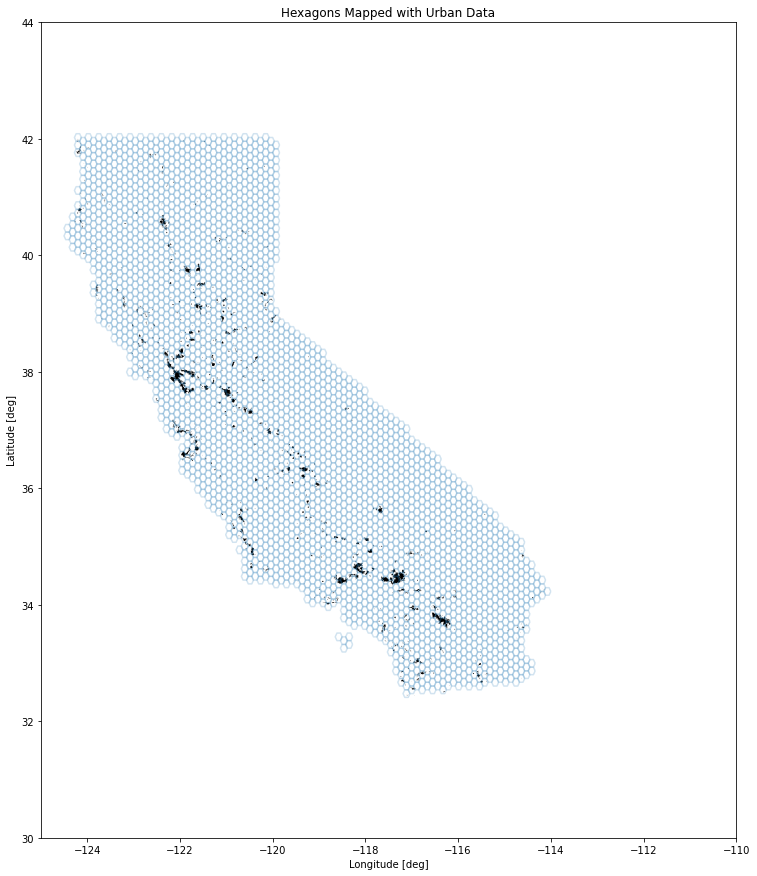

In [ ]:
fig, ax = plt.subplots(figsize=(15,15))
#gdf_combined.plot(ax=ax, cmap="Paired", column="regionID", legend=True)
gdf_urban.plot(ax=ax, color="black")
gdf_grid.boundary.plot(ax=ax, alpha=.2)
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.set_title("Hexagons Mapped with Urban Data")
ax.set_xlim(-125, -110)
ax.set_ylim(30, 44)
plt.show()

# Adding Climate/Urban DataSets

In [ ]:
cd drive/MyDrive/'Cal Fire Urban Forestry Bird Diversity Project'/'CA Grids'

/content/drive/.shortcut-targets-by-id/19j9YdaLhu7ixHd8XS0vmx4u8aFAHNFJ4/Cal Fire Urban Forestry Tree Bird Biodiversity Project/CA Grids


In [ ]:
climate_data = gpd.read_file("climate_zone_CA/climate_zone_3.shp")

In [ ]:
urban_data = gpd.read_file("urbanAreas_2014/urbanAreas_2014CA_WGS1984_fixed.shp")
urban_data = urban_data[["OBJECTID", "Acres", "Shape_Leng", "Shape_Area", "geometry"]]

In [ ]:
!echo deb http://packages.cloud.google.com/apt gcsfuse-bionic main > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | apt-key add -
!apt -qq update
!apt -qq install gcsfuse
!mkdir colab_directory
!gcsfuse --implicit-dirs urbanforest colab_directory

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  2537  100  2537    0     0    99k      0 --:--:-- --:--:-- --:--:--   99k
OK
63 packages can be upgraded. Run 'apt list --upgradable' to see them.
The following packages were automatically installed and are no longer required:
  cuda-command-line-tools-10-0 cuda-command-line-tools-10-1
  cuda-command-line-tools-11-0 cuda-compiler-10-0 cuda-compiler-10-1
  cuda-compiler-11-0 cuda-cuobjdump-10-0 cuda-cuobjdump-10-1
  cuda-cuobjdump-11-0 cuda-cupti-10-0 cuda-cupti-10-1 cuda-cupti-11-0
  cuda-cupti-dev-11-0 cuda-documentation-10-0 cuda-documentation-10-1
  cuda-documentation-11-0 cuda-documentation-11-1 cuda-gdb-10-0 cuda-gdb-10-1
  cuda-gdb-11-0 cuda-gpu-library-advisor-10-0 cuda-gpu-library-advisor-10-1
  cuda-libraries-10-0 cuda-libraries-10-1 cuda-libraries-11-0
  cuda-memcheck-10-0 cuda-memcheck-10-1 cuda-memcheck-11-0 cuda-

In [ ]:
# Removes Z column for GeoPandas
from shapely.geometry import Polygon, MultiPolygon, shape, Point
def convert_3D_2D(geometry):
    '''
    Takes a GeoSeries of 3D Multi/Polygons (has_z) and returns a list of 2D Multi/Polygons
    '''
    new_geo = []
    for p in geometry:
        if p.has_z:
            if p.geom_type == 'Polygon':
                lines = [xy[:2] for xy in list(p.exterior.coords)]
                new_p = Polygon(lines)
                new_geo.append(new_p)
            elif p.geom_type == 'MultiPolygon':
                new_multi_p = []
                for ap in p:
                    lines = [xy[:2] for xy in list(ap.exterior.coords)]
                    new_p = Polygon(lines)
                    new_multi_p.append(new_p)
                new_geo.append(MultiPolygon(new_multi_p))
    return new_geo

In [ ]:
urban_data.geometry = convert_3D_2D(urban_data.geometry)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  app.launch_new_instance()


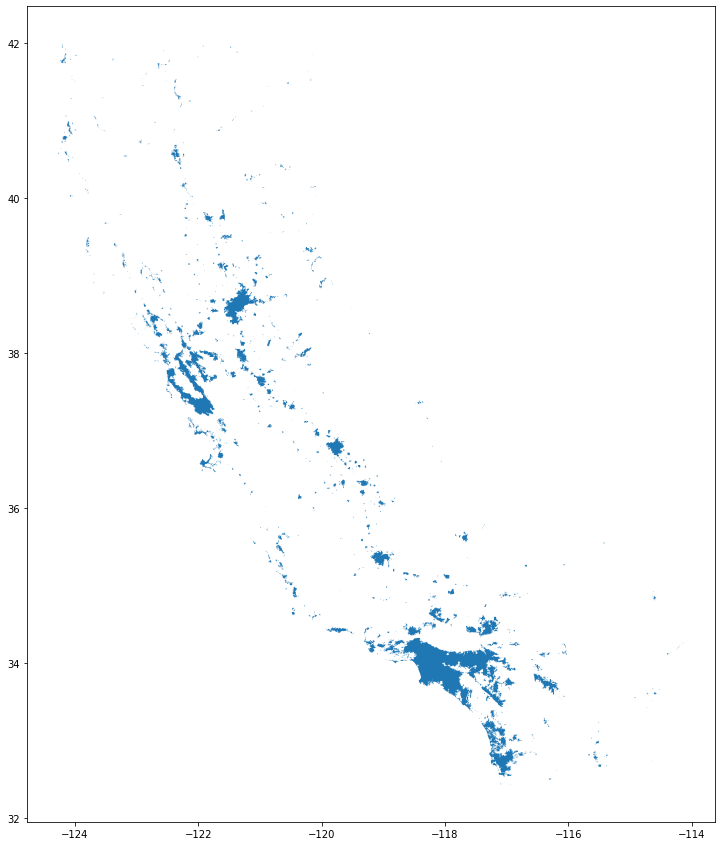

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
urban_data.plot(ax=ax)

In [ ]:
urban_data.to_csv("urbanAreas-grids.csv", index=False)
#climate_data.to_csv("climateAreas-grids.csv", index=False)

# Tree Count vs Bird Count 

In [ ]:
%%bigquery --project urban-forest-269703 total_counts
WITH grid_tree_counts AS (
     SELECT grid, COUNT(*) AS tree_count FROM `urban-forest-269703.urbanforest.final-with-grid`
    GROUP BY grid
), grid_bird_counts AS (
    SELECT grid, SUM(individualCount) AS bird_count FROM `urban-forest-269703.ebird.ebird-final`
    GROUP BY grid
)

SELECT IFNULL(tree_count,0) AS tree_count, IFNULL(bird_count,0) AS bird_count, grid.geometry 
FROM `urban-forest-269703.grid.ca-grid-hexagons` AS grid
    LEFT JOIN grid_tree_counts ON grid_tree_counts.grid = grid.ID
    LEFT JOIN grid_bird_counts ON grid_bird_counts.grid = grid.ID

In [ ]:
# Ratio of Trees to Birds per Hexagon
df_ratio = total_counts.copy()
df_ratio["ratio"] = df_ratio["tree_count"] / df_ratio["bird_count"]
gpd_ratio = gpd.GeoDataFrame(df_ratio, geometry=gpd.GeoSeries.from_wkt(df_ratio.geometry), crs="EPSG:4326")
fig,ax = plt.subplots(figsize=(15,15))
gpd_ratio.plot(ax=ax, legend=True, column="ratio")
ax.set_title("Number of Trees / Number of Birds per Hexagon")
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
fig.show()

In [ ]:
# Count of Trees by Count of Birds
fig, ax = plt.subplots(figsize=(20,15))
sns.scatterplot(ax=ax, data=total_counts, x="tree_count", y="bird_count", s=100)
ax.set_xlabel("Count of Trees in a Grid Cell", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_ylabel("Count of Birds in a Grid Cell", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Count of Trees by Count of Birds", fontdict={"fontsize":20, "fontweight":"medium"})
fig.show()

In [ ]:
# Log Count of Trees by Log Count of Birds
only_counts = total_counts[total_counts["tree_count"] != 0]
only_counts["log_tree"] = np.log(only_counts["tree_count"])
only_counts["log_bird"] = np.log(only_counts["bird_count"])
fig, ax = plt.subplots(figsize=(20,15))
sns.scatterplot(ax=ax, data=only_counts, x="log_tree", y="log_bird", s=100)
ax.set_xlabel("Log Count of Trees in a Grid Cell", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_ylabel("Log Count of Birds in a Grid Cell", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Log Count of Trees by Log Count of Birds Where Trees Exist", fontdict={"fontsize":20, "fontweight":"medium"})
fig.show()

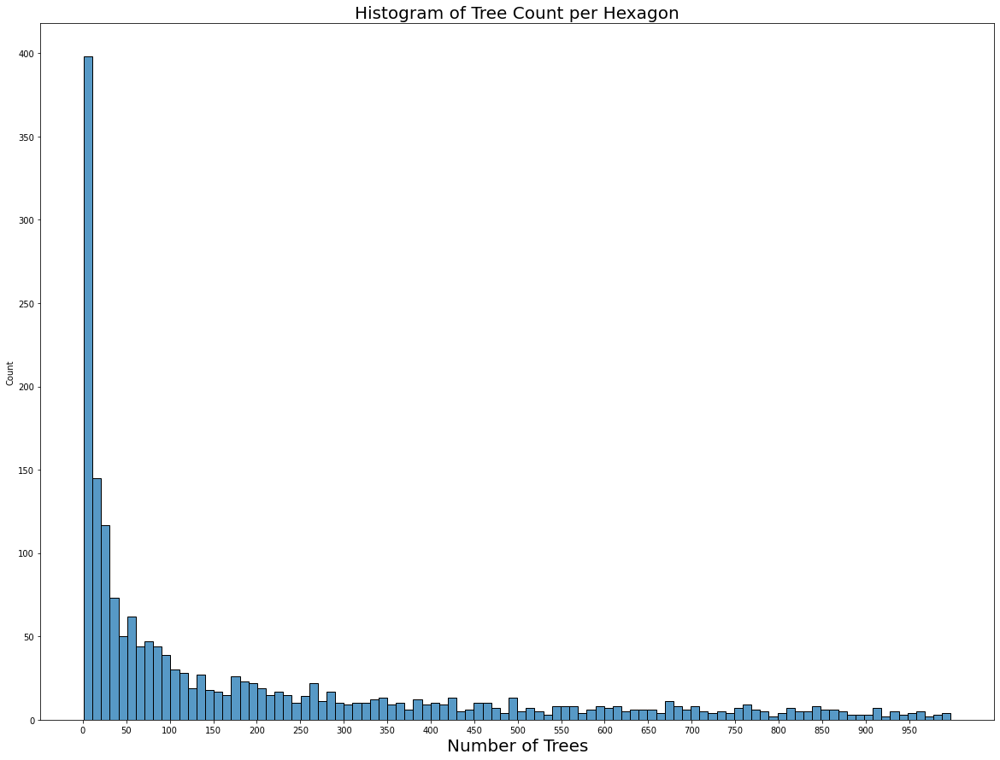

In [ ]:
#Histogram of Specified Distrubtion
var = "tree_count" #"bird_count"
label = "Tree" #"Bird"

only_counts = total_counts[(total_counts[var] != 0) & (total_counts[var] < 1000)]
fig, ax = plt.subplots(figsize=(20,15))
sns.histplot(only_counts, x=var, bins=100)
ax.set_xlabel("Number of "+label+"s", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_title("Histogram of "+label+" Count per Hexagon", fontdict={"fontsize":20, "fontweight":"medium"})
ax.set_xticks(np.arange(0,1000,50))
fig.show()

# Nativeness Graph ✓

In [ ]:
%%bigquery --project urban-forest-269703 df_trees
SELECT grid.geometry, native_count FROM (
    SELECT final.grid, SUM(final.nativity) AS native_count FROM `urban-forest-269703.urbanforest.final-with-grid` as final
    GROUP BY final.grid) AS final2
LEFT JOIN `urban-forest-269703.grid.ca-grid-hexagons` as grid ON grid.ID = final2.grid

In [ ]:
%%bigquery --project urban-forest-269703 df_grid
SELECT * FROM `urban-forest-269703.grid.ca-grid-hexagons`

In [ ]:
gpd_trees = gpd.GeoDataFrame(df_trees, geometry=gpd.GeoSeries.from_wkt(df_trees.geometry), crs="EPSG:4326")

In [ ]:
gpd_grid = gpd.GeoDataFrame(df_grid, geometry=gpd.GeoSeries.from_wkt(df_grid.geometry), crs="EPSG:4326")

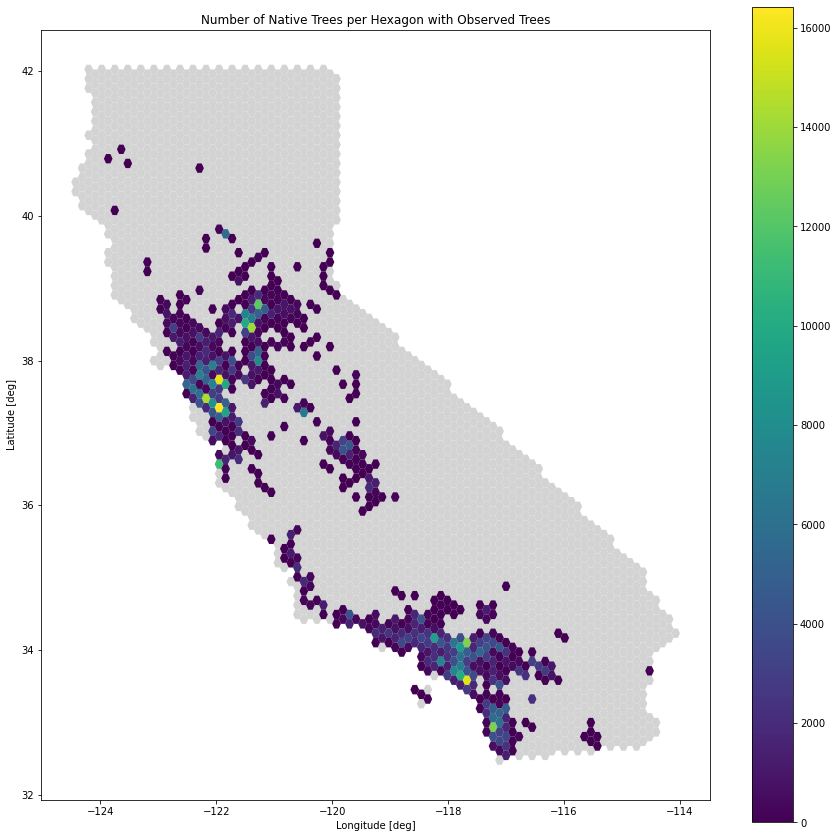

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
gpd_grid.plot(ax=ax, color="lightgrey")
gpd_trees.plot(column="native_count", ax=ax, legend=True)
ax.set_title("Number of Native Trees per Hexagon with Observed Trees")
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
fig.show()

# WORKING WITH HEXAGONS ✓

In [ ]:
#Our directory with the shapefiles for the Hexagon Grid
cd drive/MyDrive/'Cal Fire Urban Forestry Bird Diversity Project'/'CA Grids'

/content/drive/.shortcut-targets-by-id/19j9YdaLhu7ixHd8XS0vmx4u8aFAHNFJ4/Cal Fire Urban Forestry Tree Bird Biodiversity Project/CA Grids


In [ ]:
df_grids = gpd.read_file('ca_60km_hexagon_sc.shp', crs = {'init' :'epsg:4326'})

Combining Data Sets

In [ ]:
%%bigquery --project urban-forest-269703 tree_coords
SELECT id, longitude, latitude FROM `urban-forest-269703.trees.tree_attributes`

In [ ]:
%%bigquery --project urban-forest-269703 tree_coords
SELECT id, longitude, latitude FROM `urban-forest-269703.urbanforest.final`

In [ ]:
%%bigquery --project urban-forest-269703 birds_coords
SELECT DISTINCT decimalLatitude AS latitude, decimalLongitude as longitude FROM `urban-forest-269703.ebird.ebird-final`

In [ ]:
#If Grid has already been tabled
%%bigquery --project urban-forest-269703 df_grid
SELECT * FROM `urban-forest-269703.grid.ca-grid-hexagons`

In [ ]:
gdf_trees = gpd.GeoDataFrame(tree_coords,geometry=gpd.GeoSeries.from_xy(tree_coords.longitude,tree_coords.latitude),crs='EPSG:4326')
gdf_grid = gpd.GeoDataFrame(df_grid, geometry=gpd.GeoSeries.from_wkt(df_grid.geometry), crs="EPSG:4326")

In [ ]:
combined = gdf_trees.sjoin(gdf_grid, how='left')
combined_df = combined[["id", "ID"]]
combined_df.columns = ["id", "grid"]
combined_df["grid"] = combined_df["grid"].astype("Int64")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [ ]:
combined_df

,id,grid
0,7561781,36938
1,7539637,36797
2,7543759,36797
3,1244667,8210
4,7549198,6284
...,...,...
7064795,7127978,32458
7064796,7127951,32458
7064797,2281280,33434
7064798,3950629,36405


In [ ]:
#Make Sure to Mount with Google Cloud Bucket before (Later Code in this section)
combined_df.to_csv("colab_directory/trees-with-grids.csv", index=False)
#Import id as String and grid as Int

In [ ]:
gdf_grid.to_csv("colab_directory/ca-grid-hexagons.csv", index=False)
# Import ID as Int and geometry as Geography

In [ ]:
#gdf_birds = gpd.GeoDataFrame(birds_coords,geometry=gpd.GeoSeries.from_xy(birds_coords.longitude,birds_coords.latitude),crs='EPSG:4326')
#combined = gdf_birds.sjoin(gdf_grid, how='left', predicate='within')
#combined_df = combined[["longitude","latitude", "FID"]]
#combined_df.columns = ["longitude", "latitude", "grid"]
combined_df = combined_df.dropna()
combined_df["grid"] = combined_df["grid"].astype(int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
combined_df.to_csv("colab_directory/birds_with_grids.csv", index=False)
#  Lat/Long as Float and grid as Int

Mount the Google Cloud Buckets

# Upload Data to Cloud Storage ✓

In [ ]:
!echo deb http://packages.cloud.google.com/apt gcsfuse-bionic main > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | apt-key add -
!apt -qq update
!apt -qq install gcsfuse
!mkdir colab_direct
!gcsfuse --implicit-dirs urbanforest colab_direct

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  2537  100  2537    0     0  60404      0 --:--:-- --:--:-- --:--:-- 61878
OK
47 packages can be upgraded. Run 'apt list --upgradable' to see them.
The following NEW packages will be installed:
  gcsfuse
0 upgraded, 1 newly installed, 0 to remove and 47 not upgraded.
Need to get 12.0 MB of archives.
After this operation, 28.6 MB of additional disk space will be used.
Selecting previously unselected package gcsfuse.
(Reading database ... 155455 files and directories currently installed.)
Preparing to unpack .../gcsfuse_0.40.0_amd64.deb ...
Unpacking gcsfuse (0.40.0) ...
Setting up gcsfuse (0.40.0) ...
2022/04/20 18:17:18.549710 Start gcsfuse/0.40.0 (Go version go1.17.6) for app "" using mount point: /content/colab_direct
2022/04/20 18:17:18.584216 Opening GCS connection...
2022/04/20 18:17:18.953676 Mounting file system "urbanf

In [ ]:
combined_df.to_csv("colab_direct/treeAttributesWithGrids.csv", index=False)

In [ ]:
combined_df

,id,grid
0,7561781,36938
1,7539637,36797
2,7543759,36797
3,1244667,8210
4,7549198,6284
...,...,...
7064795,7127978,32458
7064796,7127951,32458
7064797,2281280,33434
7064798,3950629,36405
